## Purpose
Original repo: [DeepLearning-FromPaper](https://github.com/NinaM31/DeepLearning-FromPaper).    

This is my implementation of [Deep Convolutional Generative Adversarial Networks (DCGAN)](https://arxiv.org/pdf/1511.06434.pdf) paper, on the monet problem.

# Imports

In [8]:
import os

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt

# Custom Dataset

In [9]:
class Dataset(Dataset):
    
    def __init__(self, img_dir):
        path_list = os.listdir(img_dir)
        abspath = os.path.abspath(img_dir)

        self.img_list = [os.path.join(abspath, path) for path in path_list]

        self.transform = transforms.Compose([
            transforms.Resize(64),
            transforms.CenterCrop(64),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
        ])


    def __len__(self):
        return len(self.img_list)


    def __getitem__(self, index):
        path = self.img_list[index]
        img = Image.open(path).convert('RGB')
        return self.transform(img)

# Discriminator Class

In [10]:
class Discriminator(nn.Module):

    def __init__(self, conv_dim=32):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            nn.Conv2d(3, conv_dim, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
   
            nn.Conv2d(conv_dim, conv_dim * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(conv_dim * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(conv_dim * 2, conv_dim * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(conv_dim * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(conv_dim * 4, conv_dim * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(conv_dim * 8),
            nn.LeakyReLU(0.2, inplace=True),
          
            nn.Conv2d(conv_dim * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )


    def forward(self, x):
        return self.main(x)

# Generator Class

In [11]:
class Generator(nn.Module):
    
    def __init__(self, z_size, conv_dim=64):
        super(Generator, self).__init__()

        self.main = nn.Sequential(
            nn.ConvTranspose2d( z_size, conv_dim * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(conv_dim * 8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(conv_dim * 8, conv_dim * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(conv_dim * 4),
            nn.ReLU(True),
           
            nn.ConvTranspose2d( conv_dim * 4, conv_dim * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(conv_dim * 2),
            nn.ReLU(True),
           
            nn.ConvTranspose2d( conv_dim * 2, conv_dim, 4, 2, 1, bias=False),
            nn.BatchNorm2d(conv_dim),
            nn.ReLU(True),
          
            nn.ConvTranspose2d( conv_dim, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )


    def forward(self, x):
        x = x.view(x.size(0), x.size(1), 1, 1) 
        return self.main(x)

# DCGAN Class

In [12]:
class DCGAN:

    def __init__(self, z_size, conv_dim):
        self.z_size = z_size

        self.D = Discriminator(conv_dim)
        self.G = Generator(z_size, conv_dim)

        self.device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    
        self.D.to(self.device)
        self.G.to(self.device)

        self.D.apply(self.weights_init)
        self.G.apply(self.weights_init)

        
    def weights_init(self, m):
        classname = m.__class__.__name__
        if classname.find('Conv') != -1:
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        elif classname.find('BatchNorm') != -1:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0)

            
    def describe(self):
        print('Discriminator')
        print(self.D)

        print('\nGenerator')
        print(self.G)

    
    def __calculate_loss(self, output, labels):
        criterion = nn.BCELoss()
        return criterion(output.squeeze(), labels)


    def real_loss(self, D_out):
        batch_size = D_out.size(0)
        labels = torch.ones(batch_size).to(self.device)*0.8

        return self.__calculate_loss(D_out, labels) 


    def fake_loss(self, D_out):
        batch_size = D_out.size(0)
        labels = torch.ones(batch_size).to(self.device)*0.1
 
        return self.__calculate_loss(D_out, labels)


    def noise(self, size):
        z = np.random.uniform(-1, 1, size=size)
        return torch.from_numpy(z).float().to(self.device)


    def train_generator(self, g_optim, size):
        g_optim.zero_grad()

        z = self.noise(size)
        fake_images = self.G(z)
        
        d_fake = self.D(fake_images)

        g_loss = self.real_loss(d_fake)

        g_loss.backward()
        g_optim.step()

        return g_loss.item()

    
    def train_discriminator(self, d_optim, real_images, size):
        d_optim.zero_grad()

        d_real = self.D(real_images.to(self.device)).view(-1)
        d_real_loss = self.real_loss(d_real)

        z = self.noise(size)
        fake_images = self.G(z)
      
        d_fake = self.D(fake_images)
        d_fake_loss = self.fake_loss(d_fake)

        d_loss = d_real_loss + d_fake_loss

        d_loss.backward()
        d_optim.step()

        return d_loss.item()


    def train(self, num_epochs, d_optim, g_optim, data_loader, z_size, sample_size, print_every=500):
        samples, losses = [], []

        z = self.noise((sample_size, z_size))

        self.D.train()
        self.G.train()

        print(f'Running on {self.device}')
        for epoch in range(num_epochs):
            for i, real_images in enumerate(data_loader):                    
                batch_size = real_images.size(0)

                d_loss = self.train_discriminator(d_optim, real_images, (sample_size, z_size))
                g_loss = self.train_generator(g_optim, (sample_size, z_size))

                if i % print_every == 0:
                    print('Epoch [{:5d}/{:5d}] | d_loss {:6.4f} | g_loss {:6.4f}'.format(
                        epoch+1,
                        num_epochs,
                        d_loss,
                        g_loss
                    ))


            losses.append( (d_loss, g_loss) )

            self.G.eval()
            samples.append( self.G(z) )
            fig, axes = plt.subplots(figsize=(15,10), nrows=2, ncols=4, sharey=True, sharex=True)
            for ax, img in zip(axes.flatten(), samples[-1]):
                _, w, h = img.size()
                 
                img = img.detach().cpu().numpy()
            
                img = np.transpose(img, (1, 2, 0))
                
                img = ((img +1)*255 / (2)).astype(np.uint8)
            
                ax.xaxis.set_visible(False)
                ax.yaxis.set_visible(False)
                
                im = ax.imshow(img.reshape((w,h,3)))
            
            plt.show()
            self.G.train()

        with open('DCGAN_Sample_Output.pkl', 'wb') as f:
            pkl.dump(samples, f)

        return samples, losses 

# Let's Generate Art


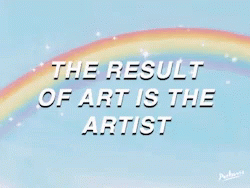

In [13]:
DATA_DIR = 'data'

BATCH_SIZE = 32
N_WORKERS = 0

Z_SIZE = 128
SAMPLE_SIZE = 16
CONV_DIM = 64

lr = 0.0002
beta1=0.5
beta2=0.999

EPOCHS = 250

Running on cuda
Epoch [    1/  250] | d_loss 1.5899 | g_loss 1.6174


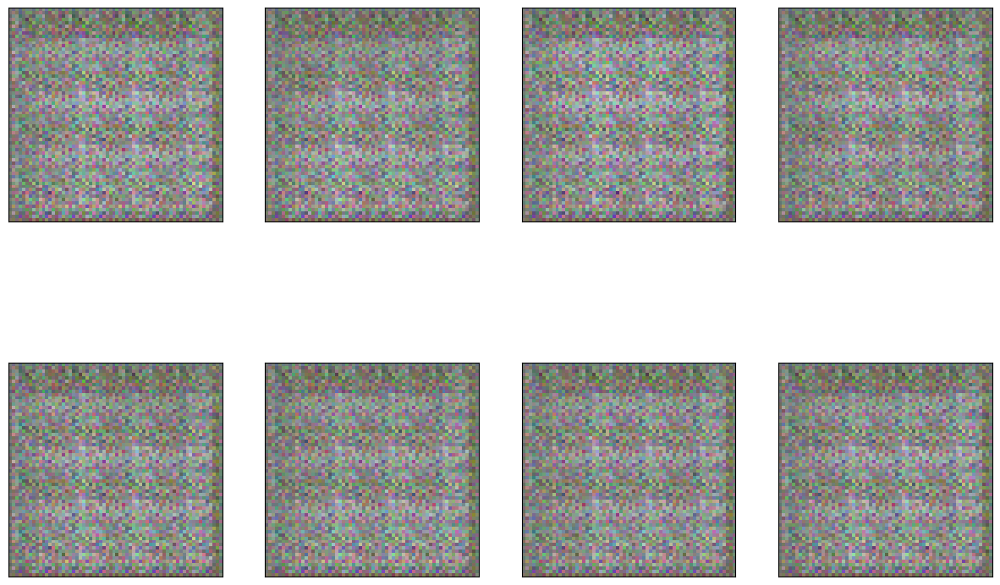

Epoch [    2/  250] | d_loss 1.2120 | g_loss 4.7549


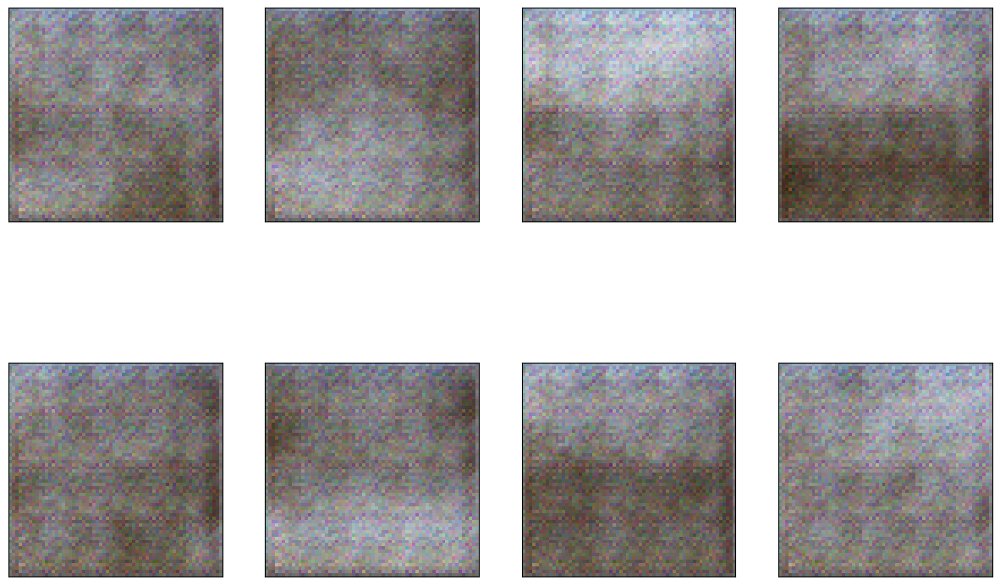

Epoch [    3/  250] | d_loss 0.9791 | g_loss 1.2602


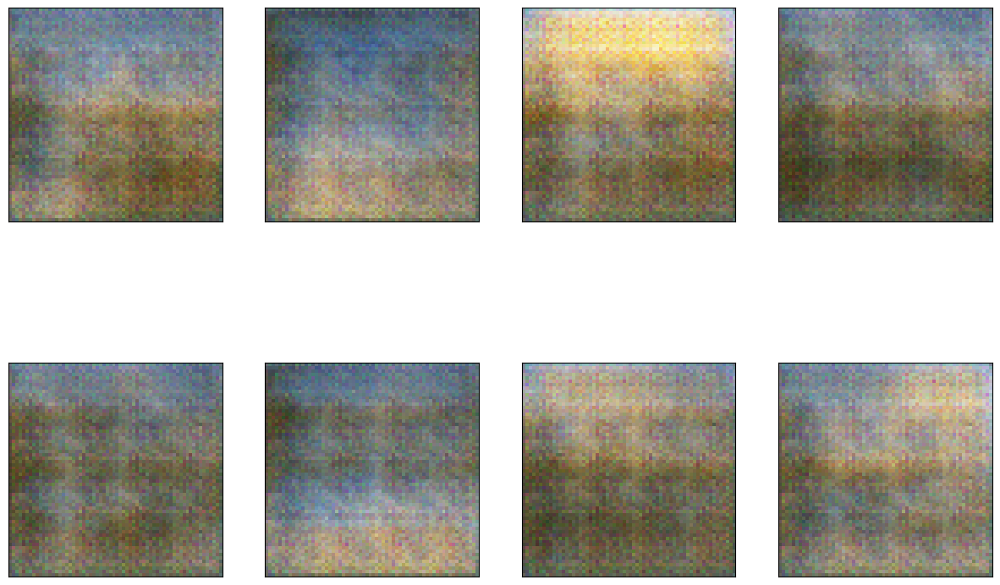

Epoch [    4/  250] | d_loss 1.4196 | g_loss 3.2842


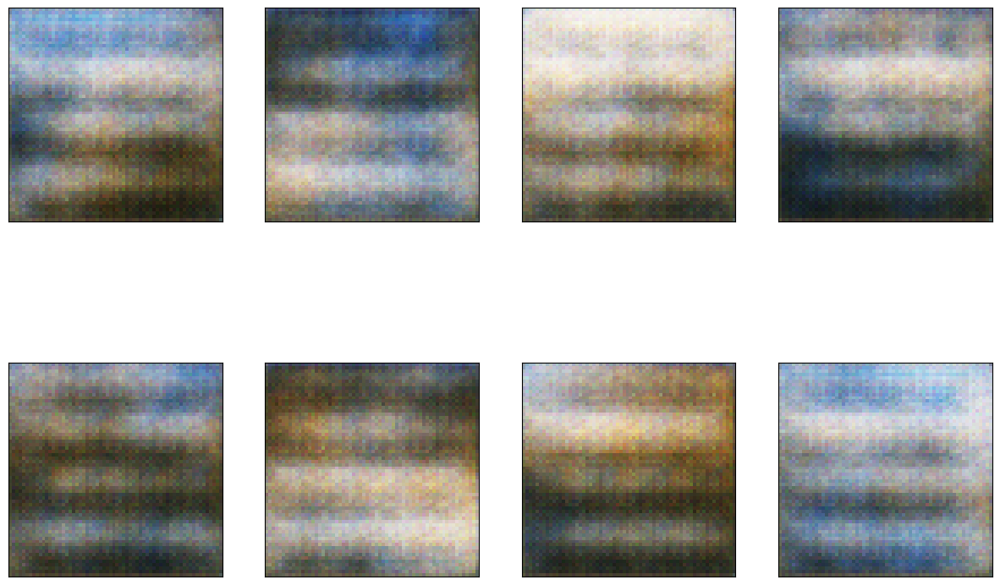

Epoch [    5/  250] | d_loss 1.1692 | g_loss 0.8745


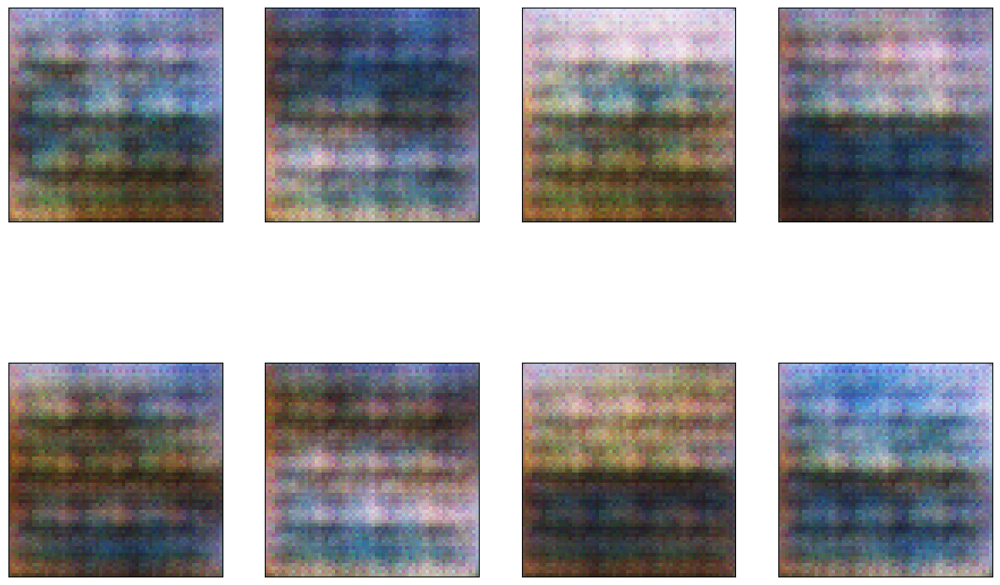

Epoch [    6/  250] | d_loss 1.0408 | g_loss 2.7450


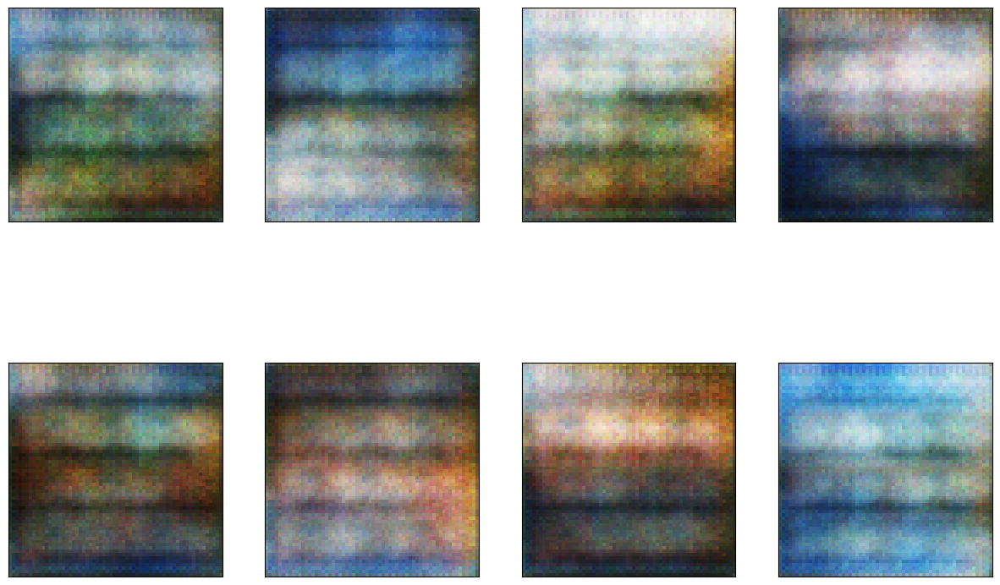

Epoch [    7/  250] | d_loss 0.9510 | g_loss 2.3373


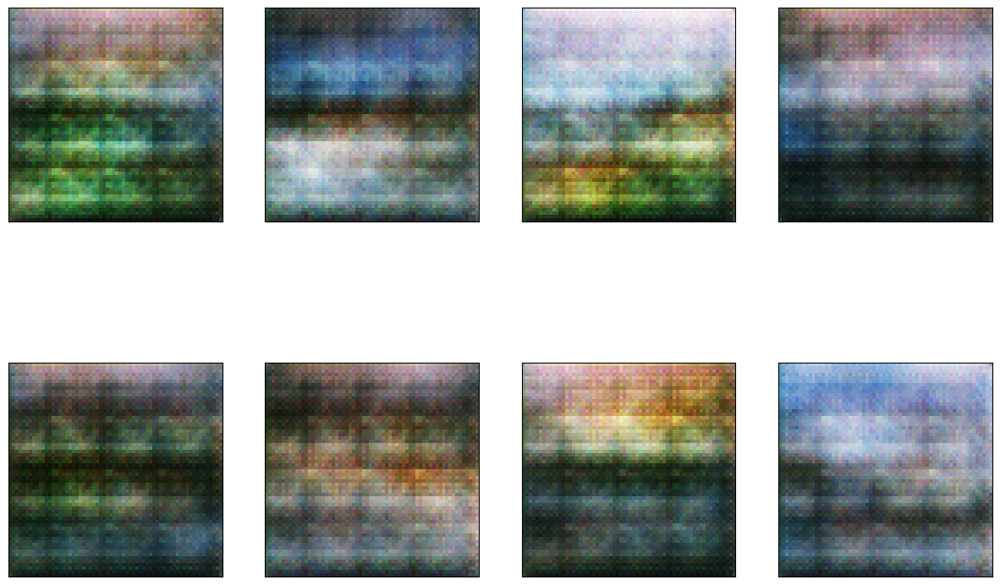

Epoch [    8/  250] | d_loss 1.0518 | g_loss 1.7303


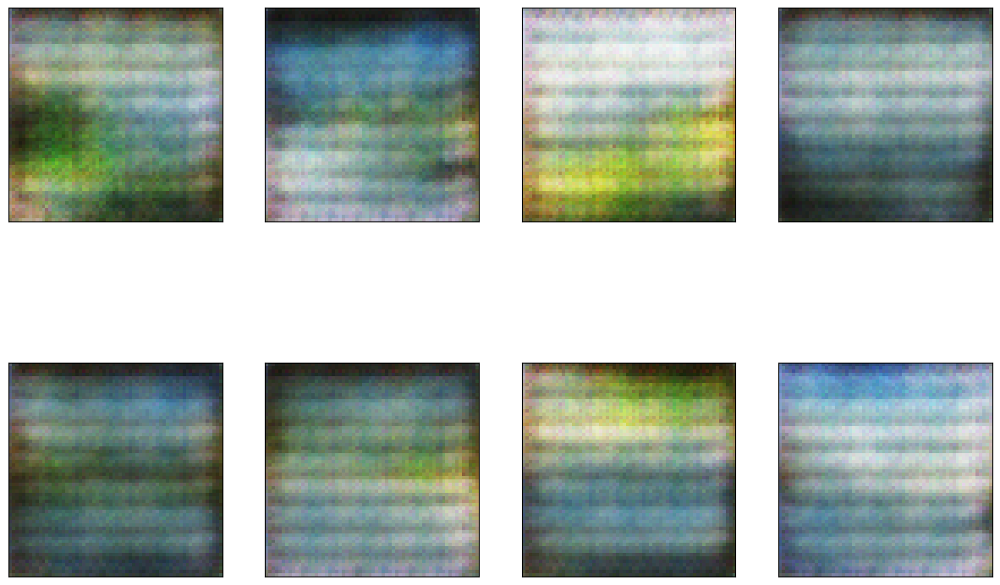

Epoch [    9/  250] | d_loss 1.1874 | g_loss 1.6795


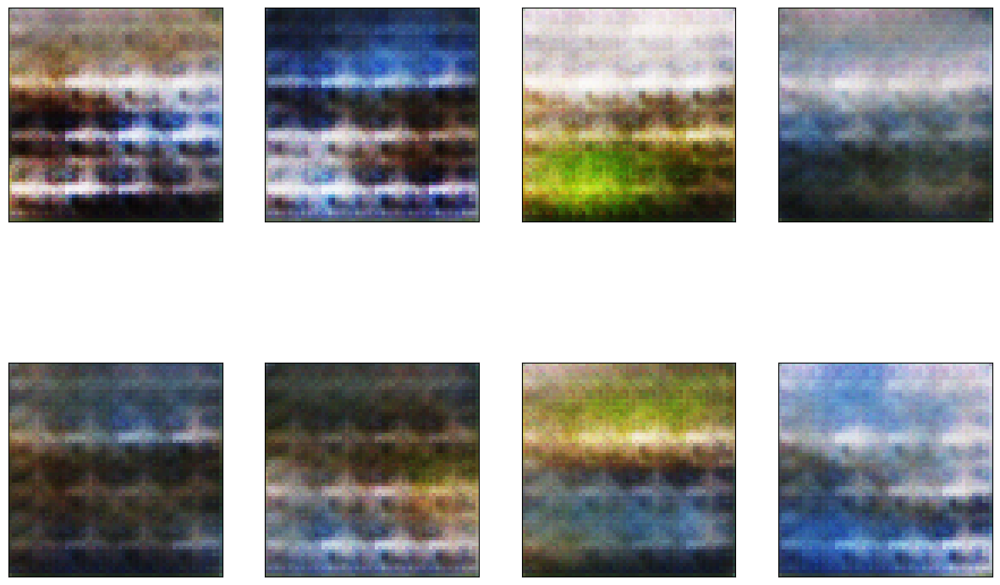

Epoch [   10/  250] | d_loss 1.0075 | g_loss 1.3622


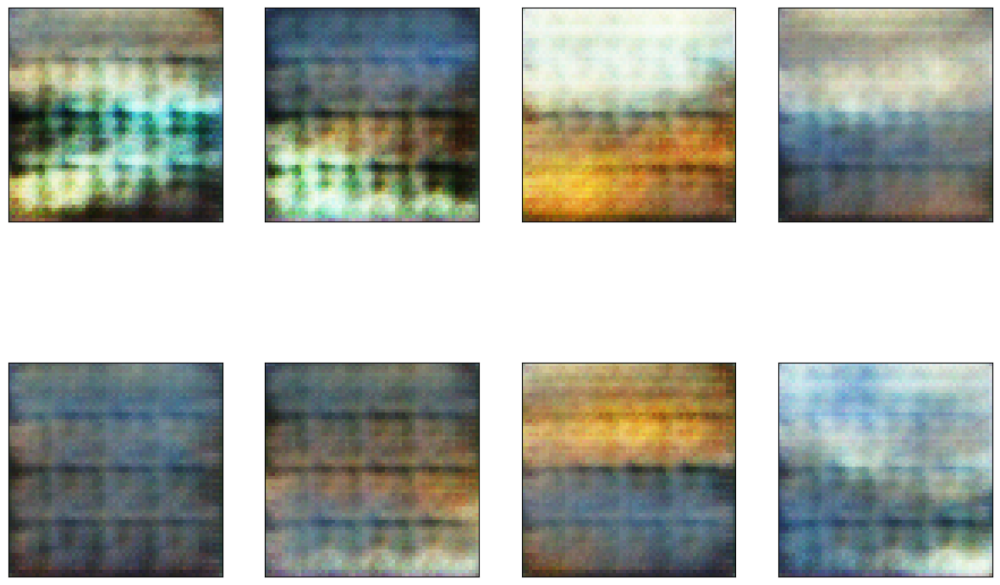

Epoch [   11/  250] | d_loss 0.8944 | g_loss 1.3731


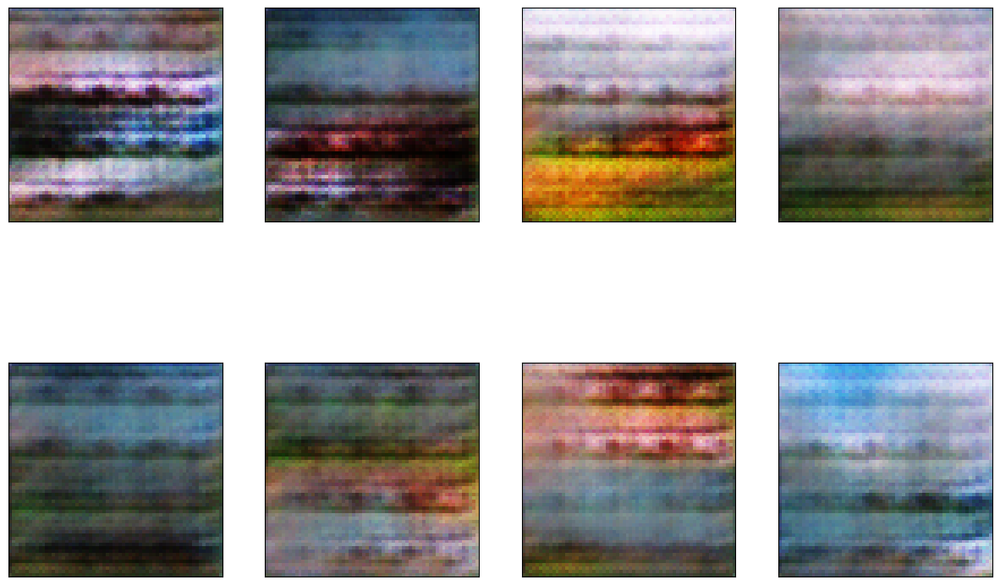

Epoch [   12/  250] | d_loss 1.0607 | g_loss 1.2466


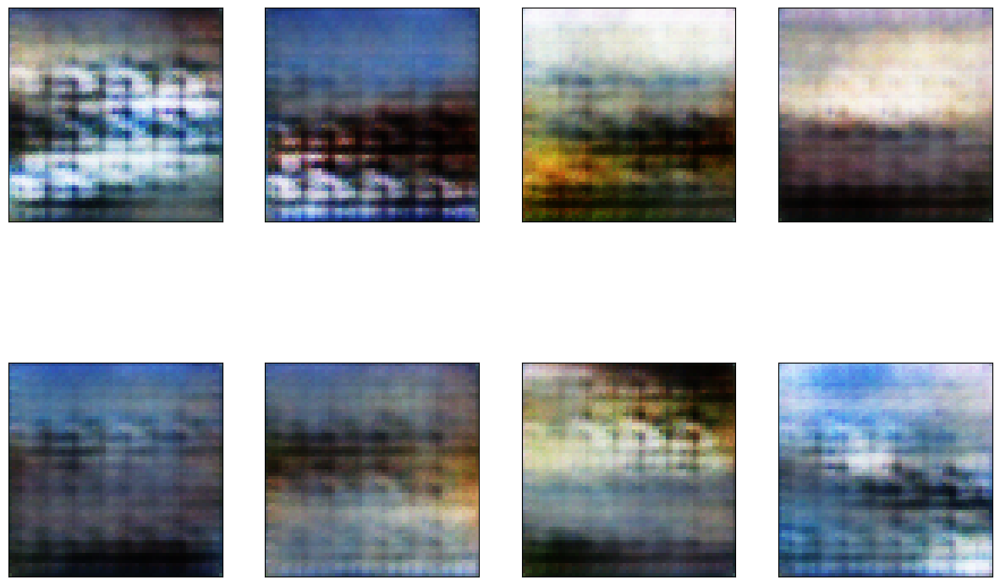

Epoch [   13/  250] | d_loss 1.0929 | g_loss 1.0323


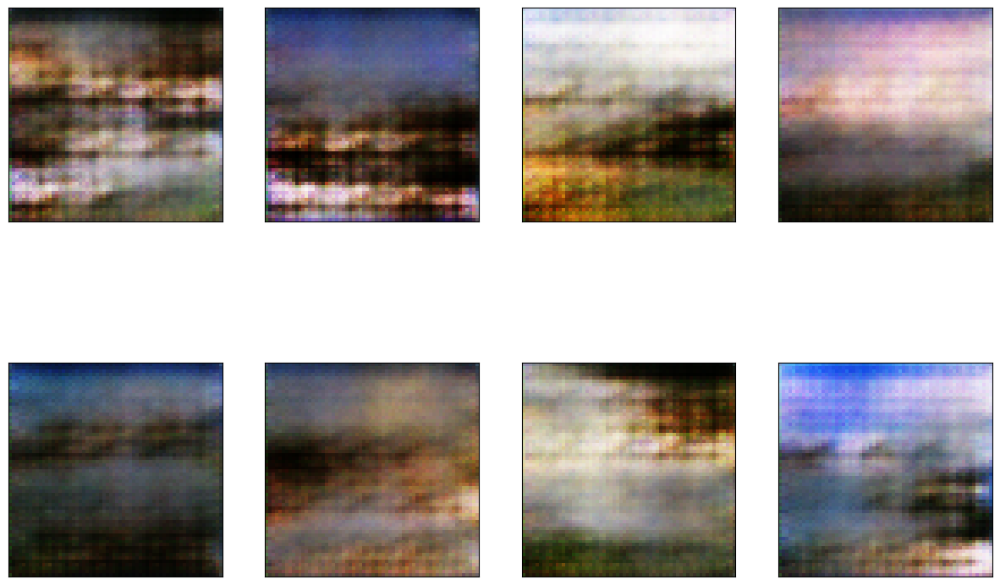

Epoch [   14/  250] | d_loss 0.9670 | g_loss 1.8151


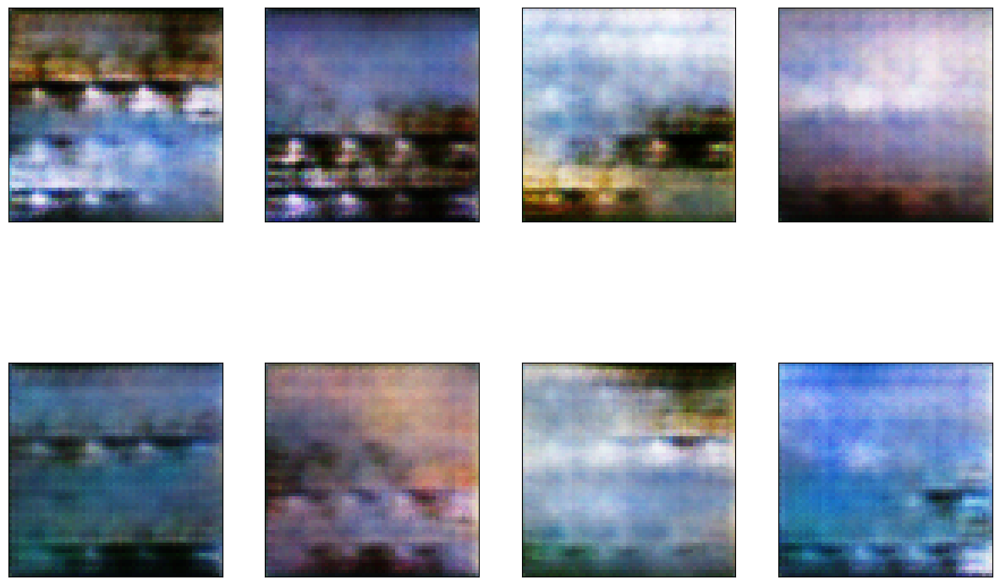

Epoch [   15/  250] | d_loss 0.9429 | g_loss 2.2032


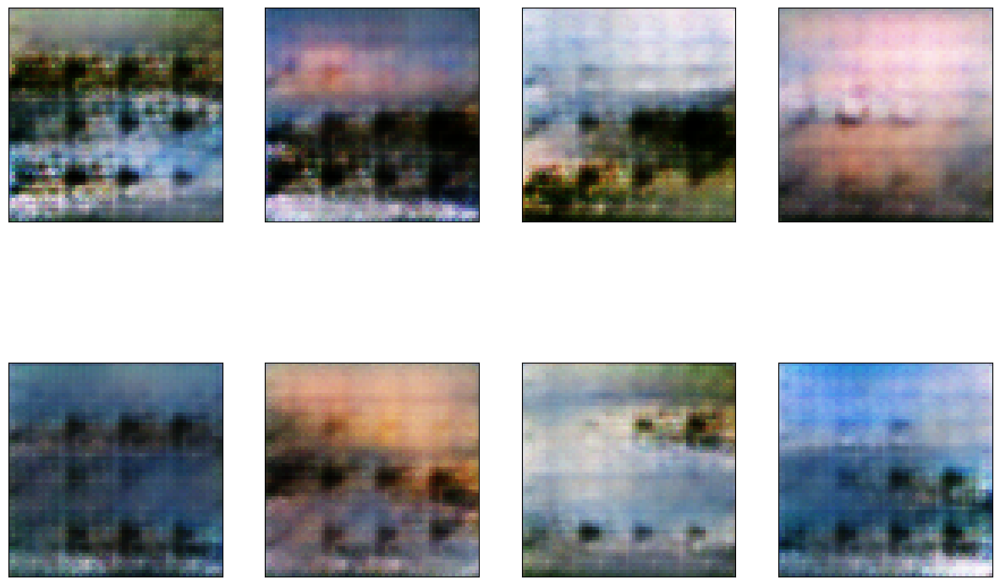

Epoch [   16/  250] | d_loss 0.9421 | g_loss 2.6087


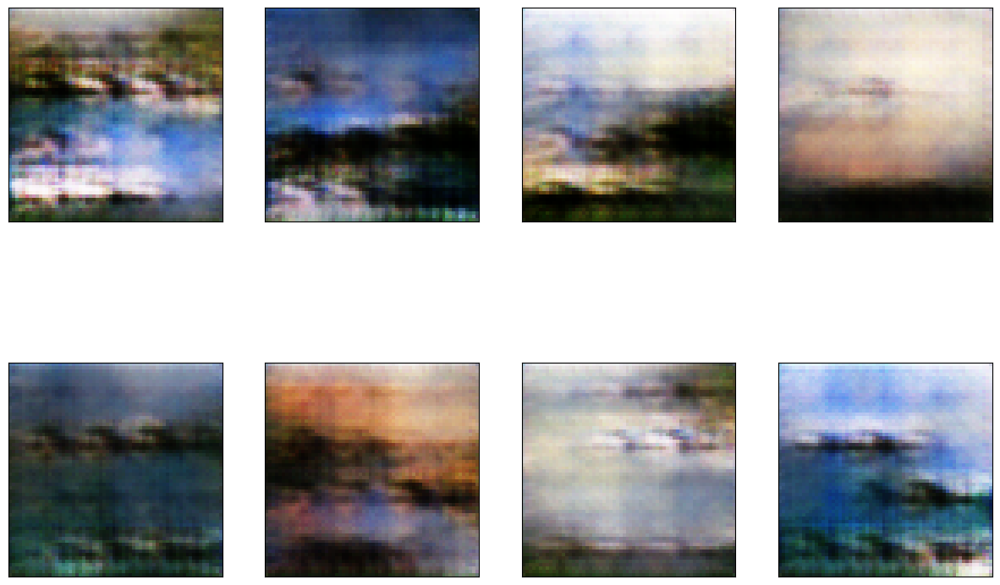

Epoch [   17/  250] | d_loss 1.0365 | g_loss 1.8469


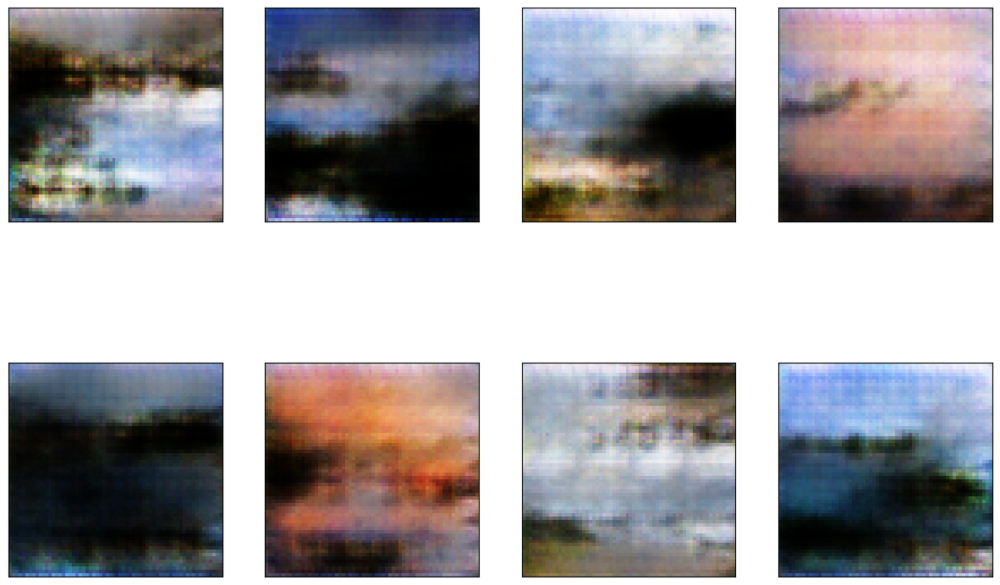

Epoch [   18/  250] | d_loss 1.0644 | g_loss 1.2957


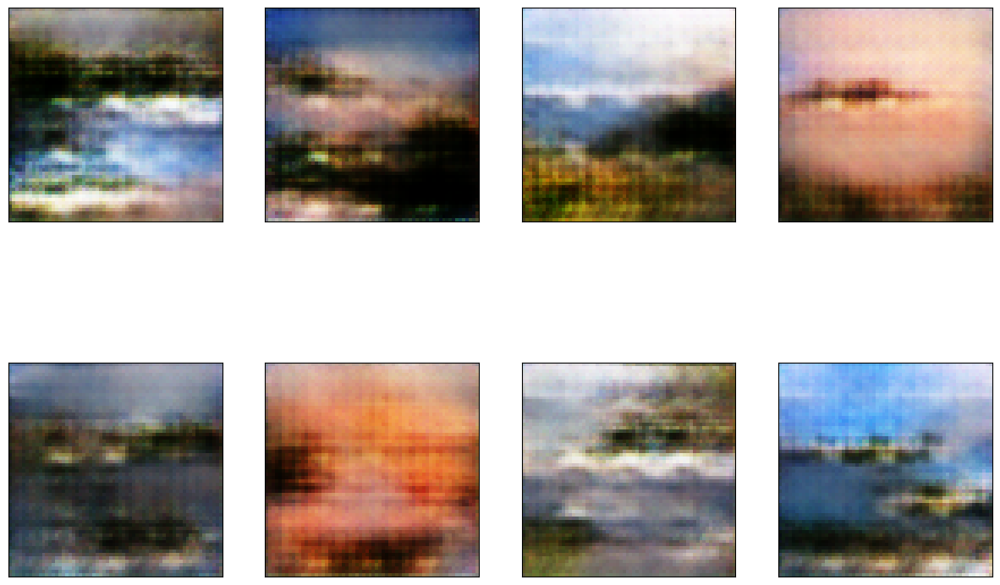

Epoch [   19/  250] | d_loss 1.0445 | g_loss 2.2379


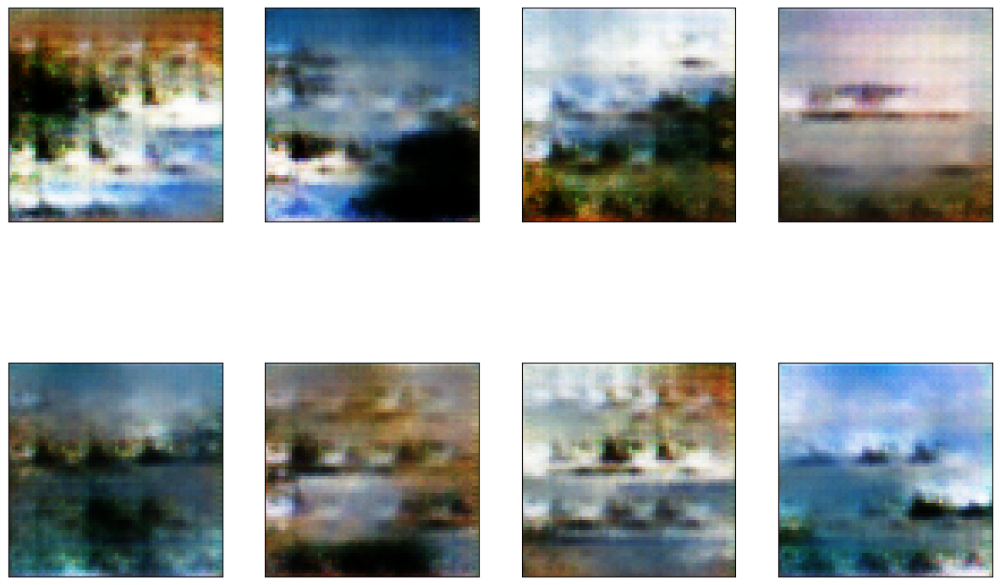

Epoch [   20/  250] | d_loss 1.0497 | g_loss 1.7193


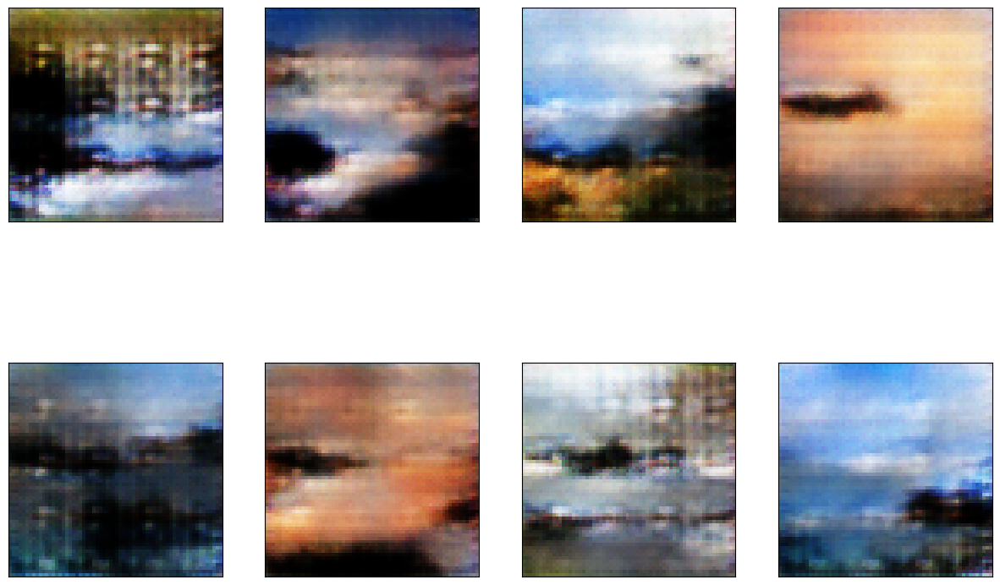

Epoch [   21/  250] | d_loss 0.9322 | g_loss 1.8481


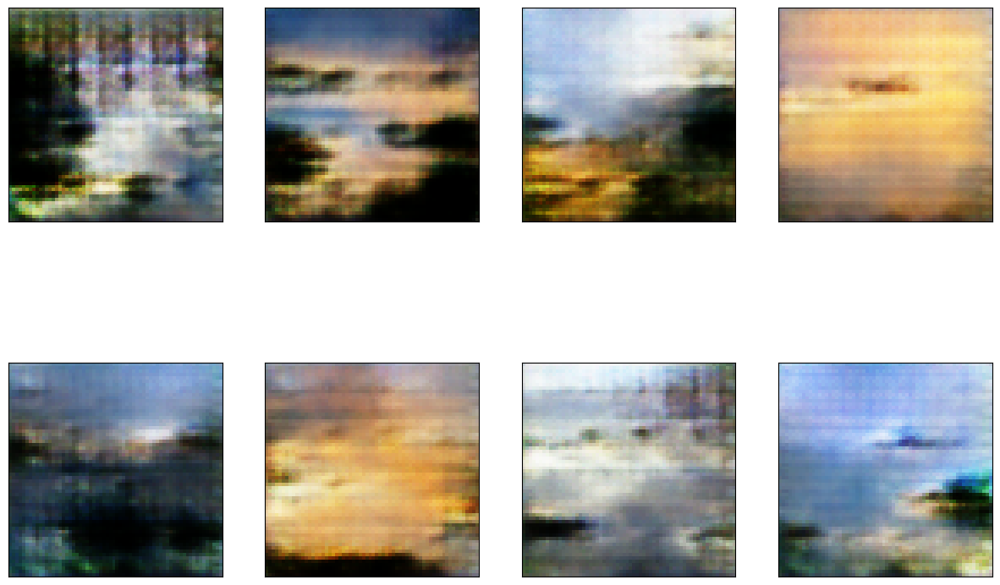

Epoch [   22/  250] | d_loss 0.9309 | g_loss 2.2027


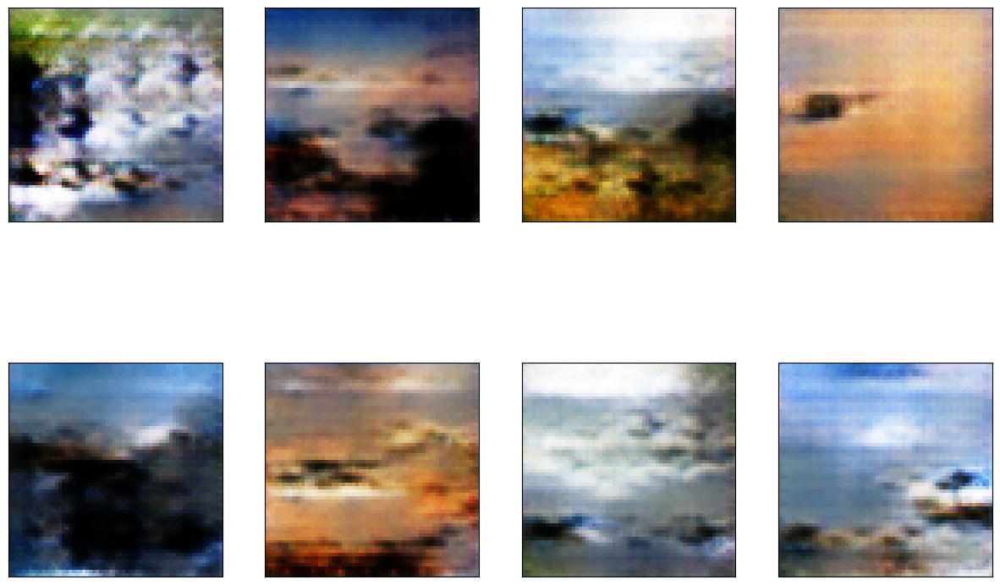

Epoch [   23/  250] | d_loss 0.9175 | g_loss 1.6886


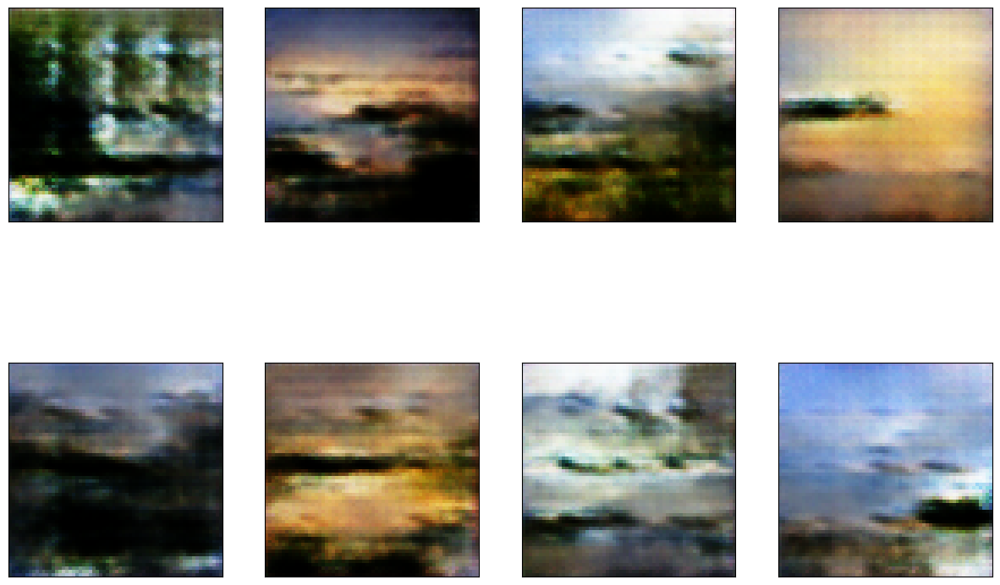

Epoch [   24/  250] | d_loss 0.9948 | g_loss 0.9707


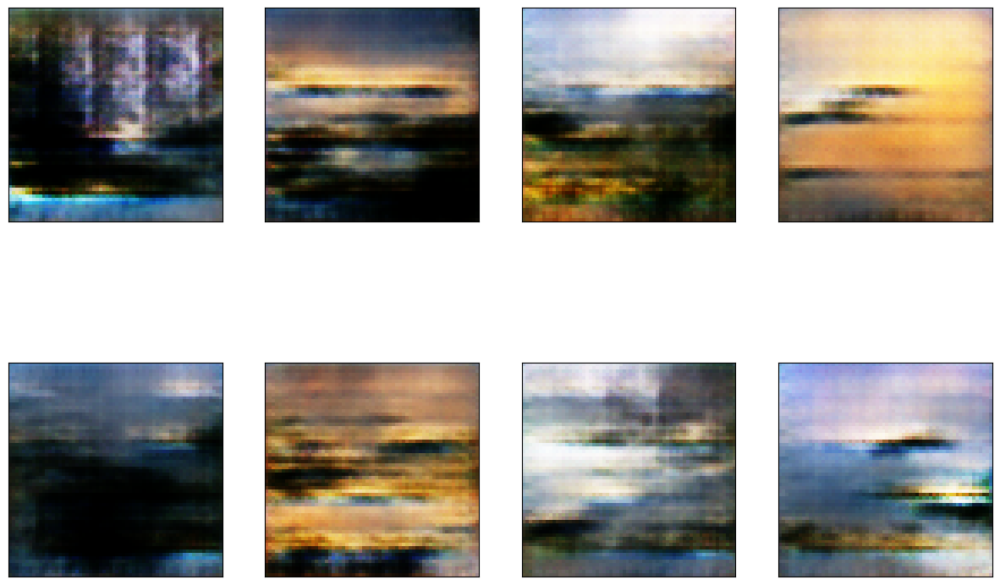

Epoch [   25/  250] | d_loss 0.9904 | g_loss 1.2129


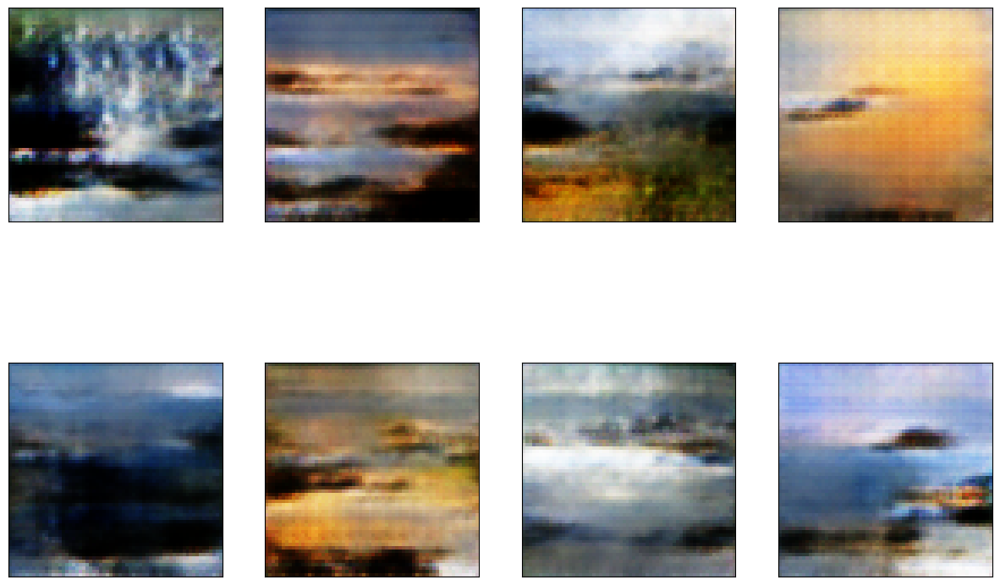

Epoch [   26/  250] | d_loss 0.9719 | g_loss 1.6639


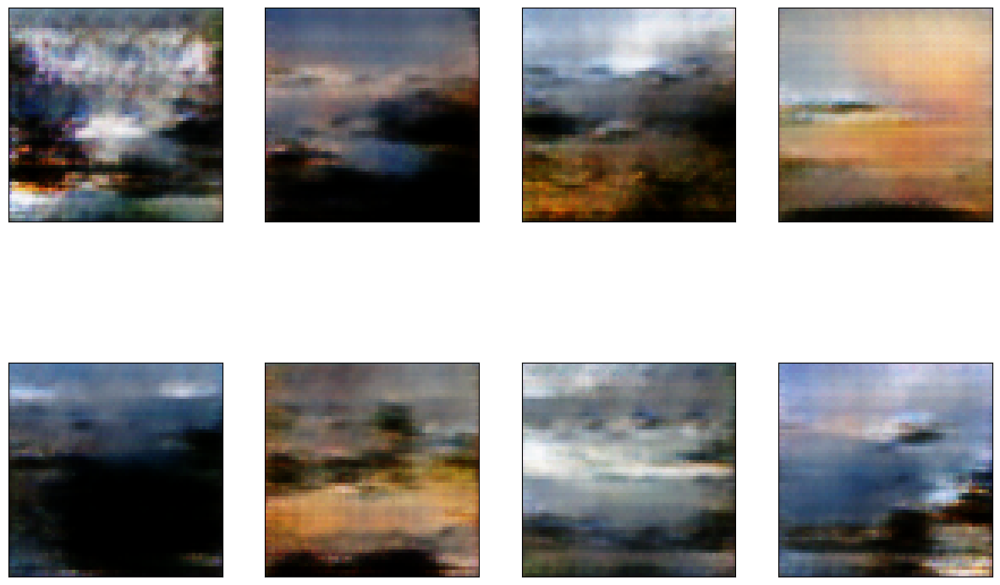

Epoch [   27/  250] | d_loss 1.0017 | g_loss 2.0727


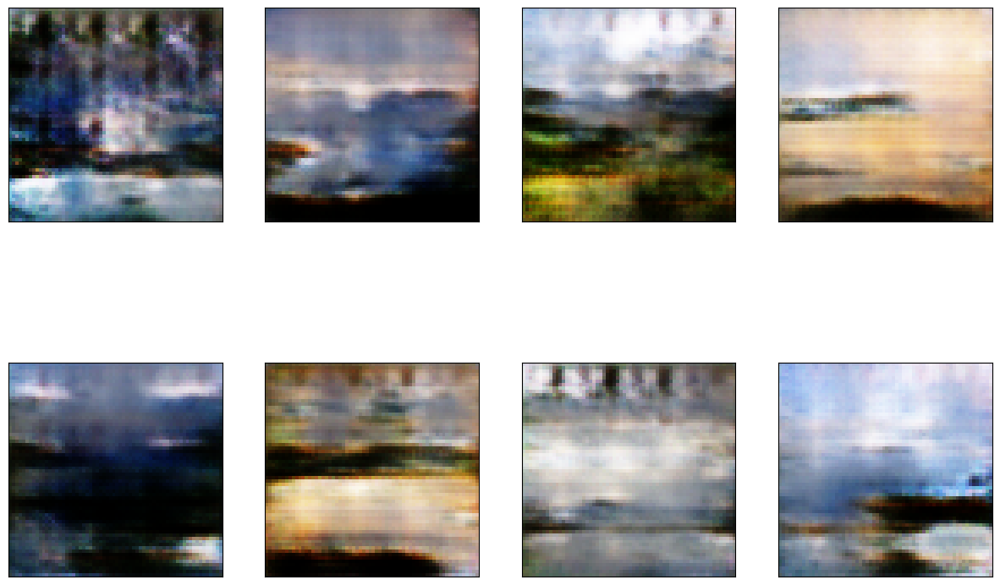

Epoch [   28/  250] | d_loss 0.8754 | g_loss 1.6148


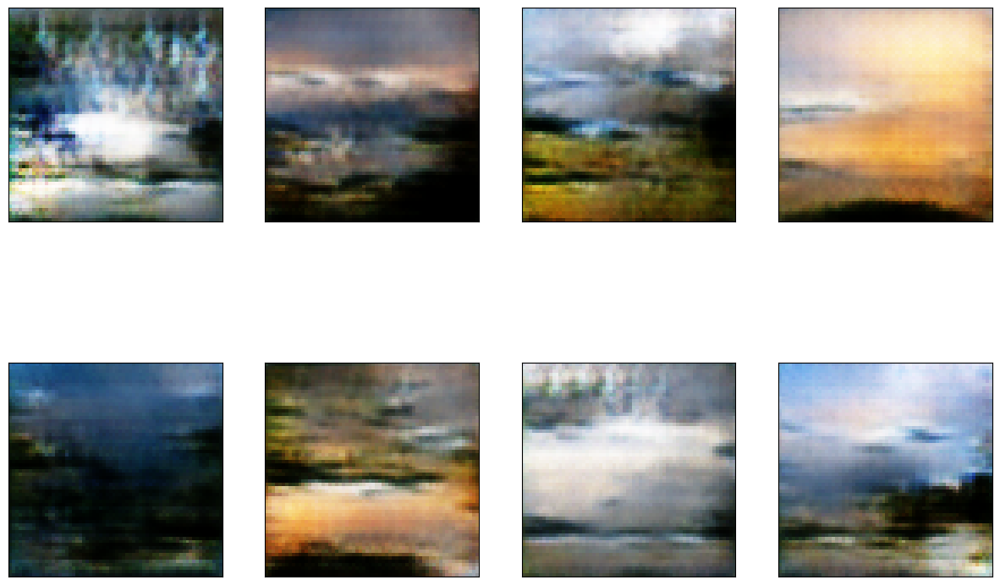

Epoch [   29/  250] | d_loss 0.9590 | g_loss 1.6578


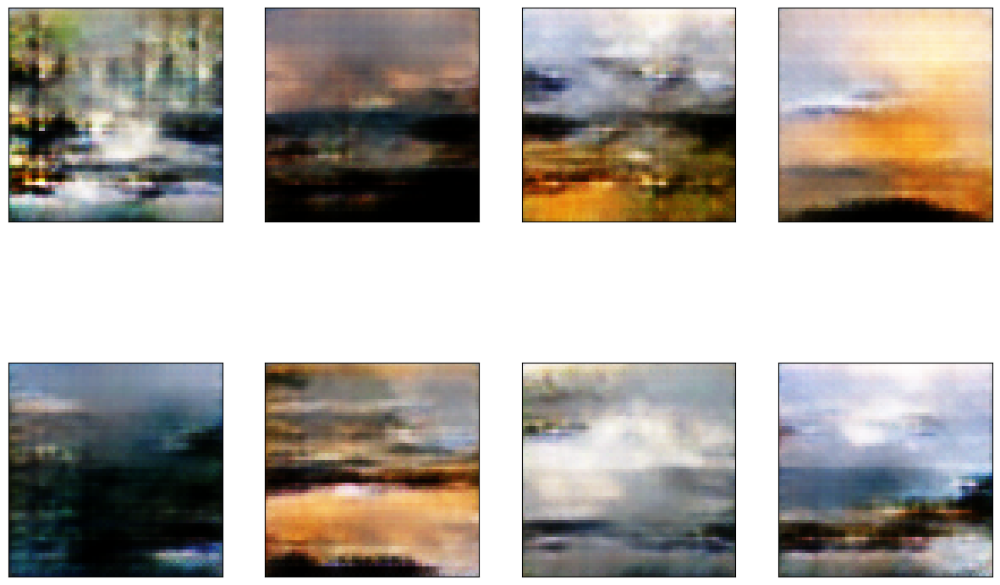

Epoch [   30/  250] | d_loss 0.9115 | g_loss 1.3412


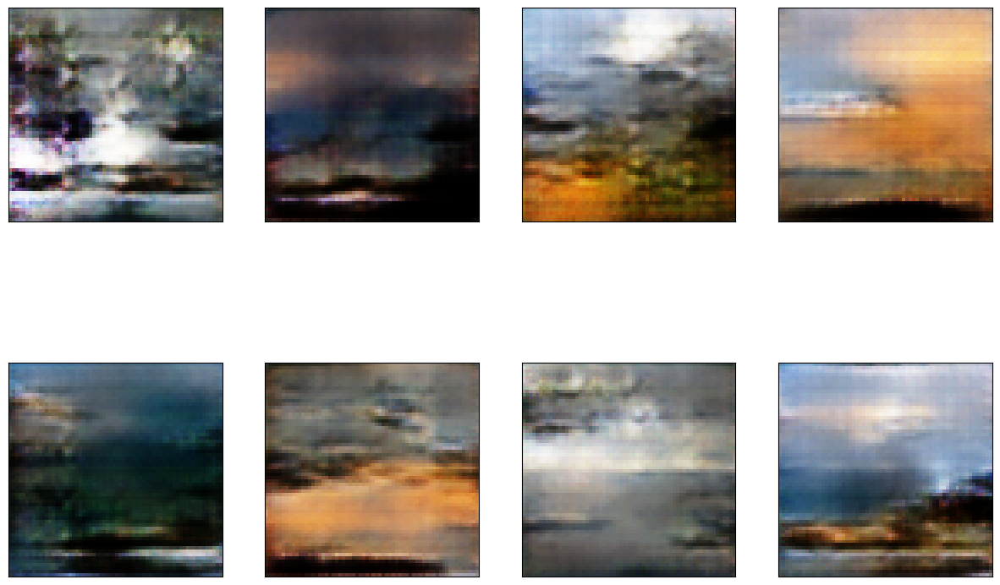

Epoch [   31/  250] | d_loss 1.0327 | g_loss 1.6559


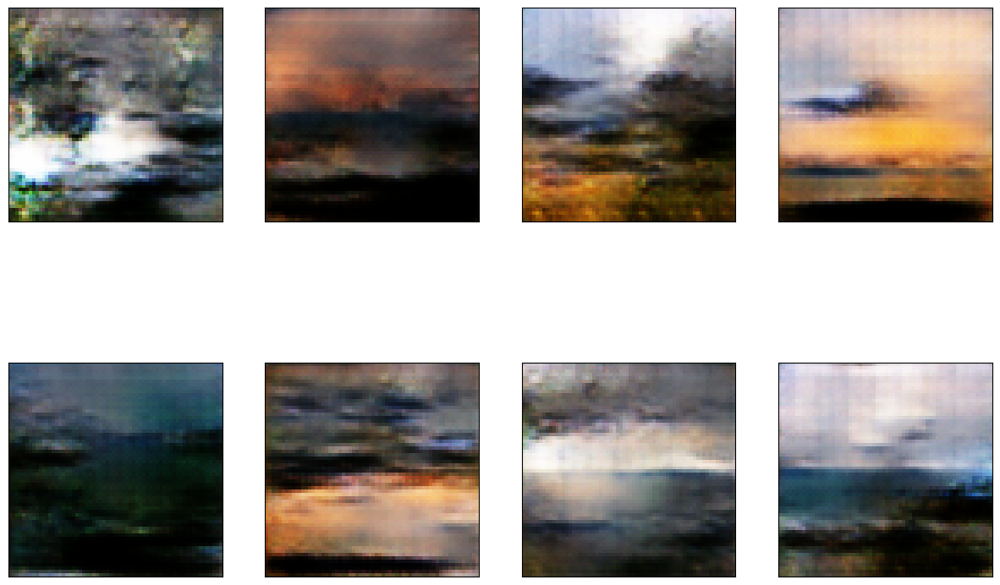

Epoch [   32/  250] | d_loss 0.9279 | g_loss 2.0281


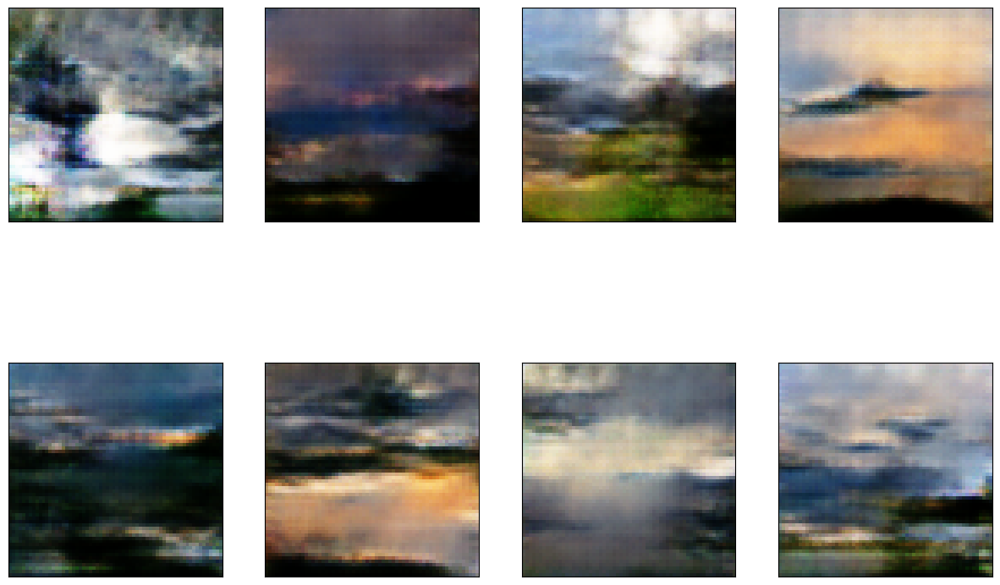

Epoch [   33/  250] | d_loss 0.9483 | g_loss 1.3480


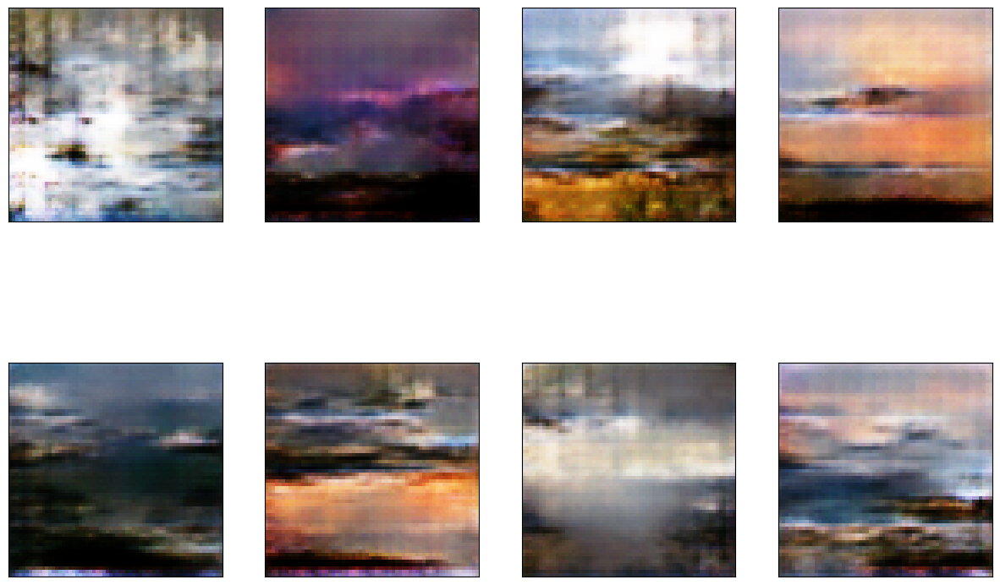

Epoch [   34/  250] | d_loss 0.9760 | g_loss 1.9124


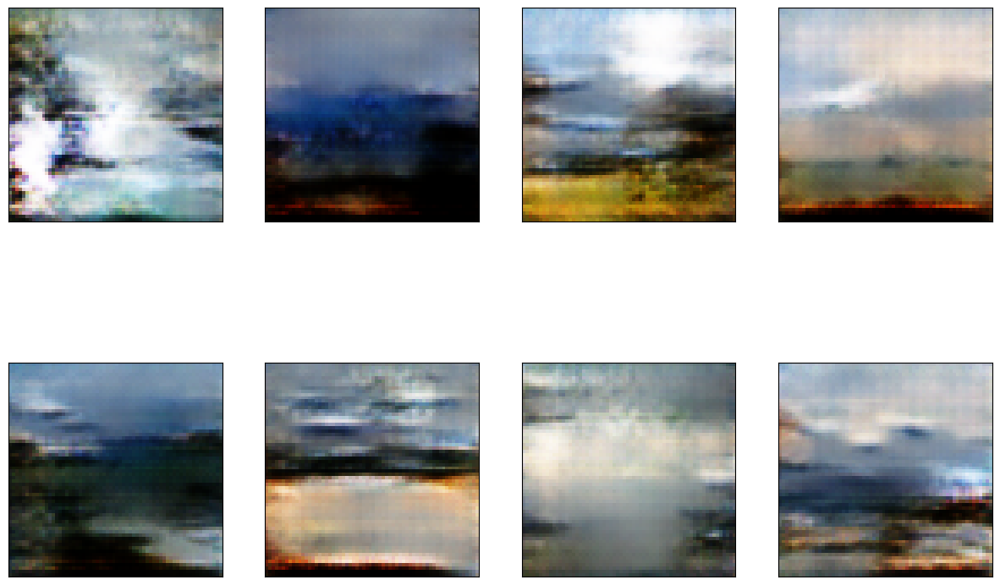

Epoch [   35/  250] | d_loss 0.8971 | g_loss 2.0048


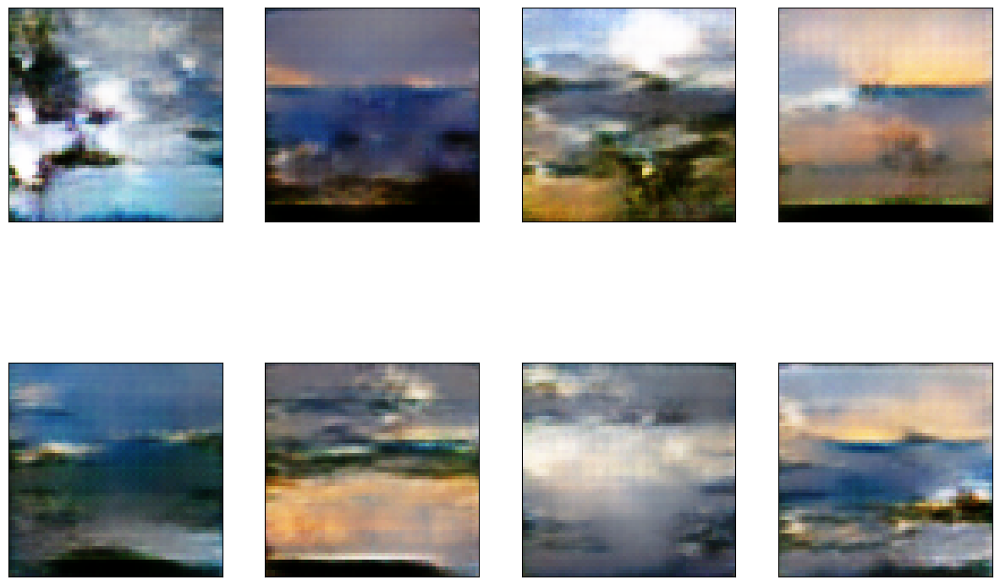

Epoch [   36/  250] | d_loss 0.8727 | g_loss 1.7155


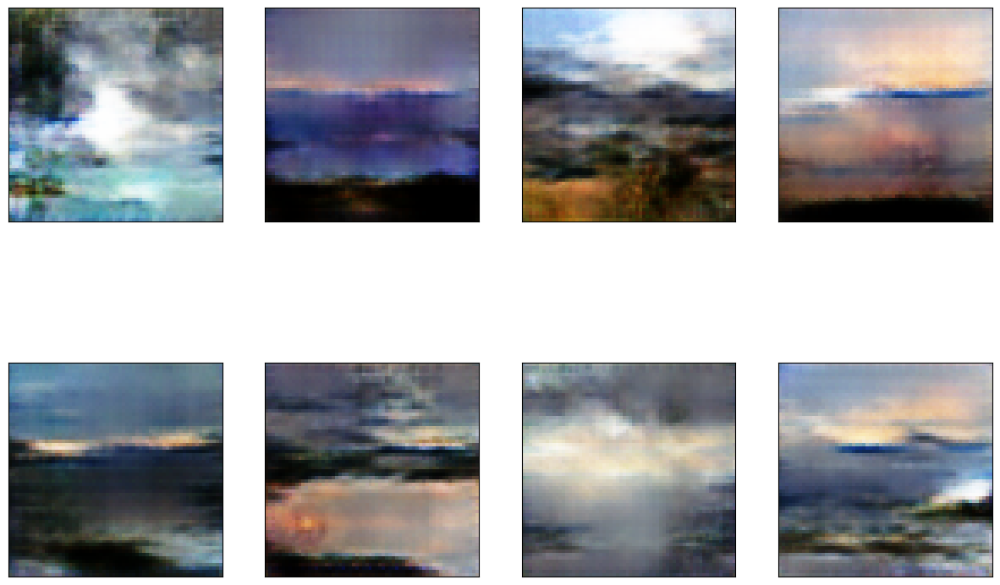

Epoch [   37/  250] | d_loss 1.2400 | g_loss 1.6861


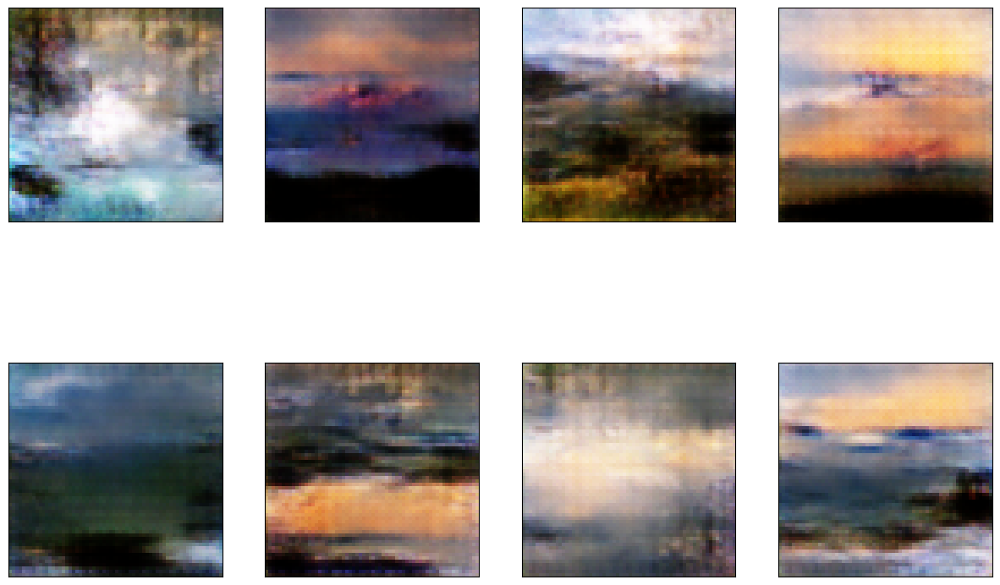

Epoch [   38/  250] | d_loss 0.9174 | g_loss 1.3891


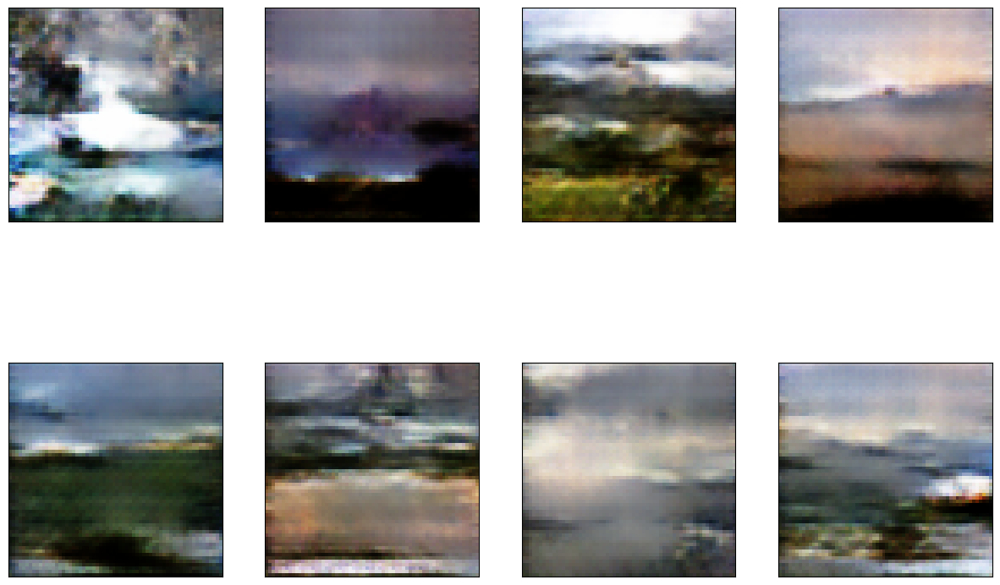

Epoch [   39/  250] | d_loss 1.1053 | g_loss 2.1315


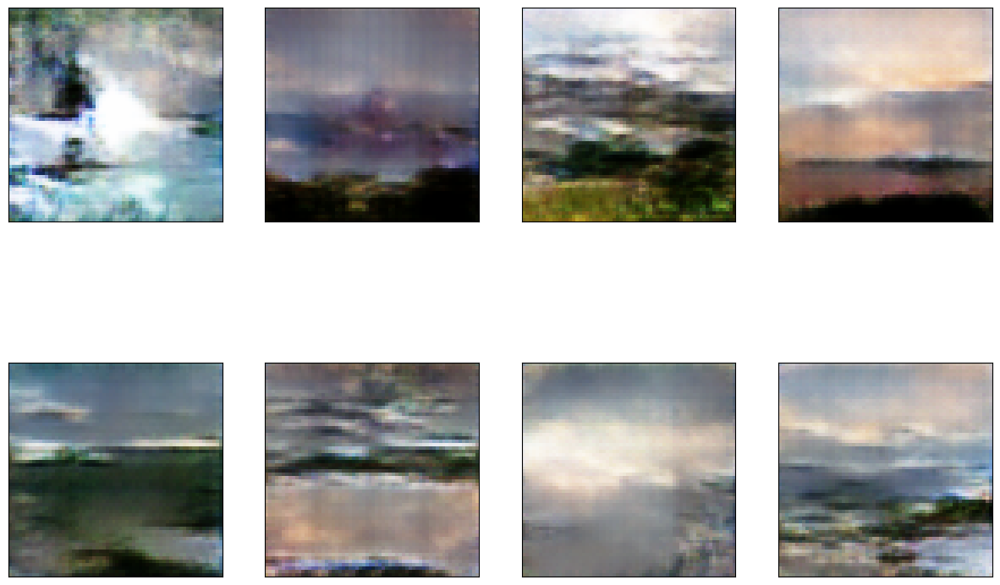

Epoch [   40/  250] | d_loss 1.0477 | g_loss 1.6836


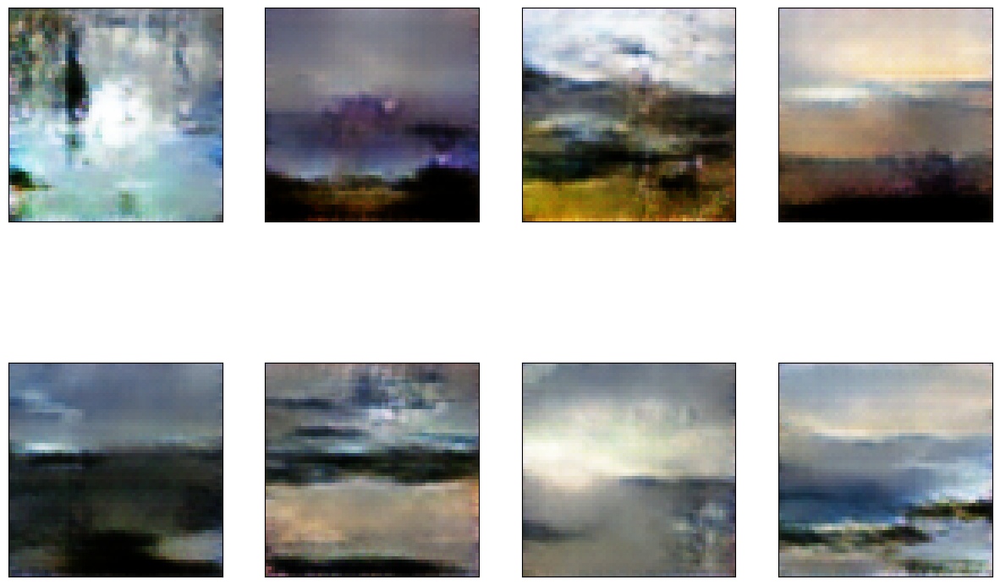

Epoch [   41/  250] | d_loss 0.9956 | g_loss 1.8739


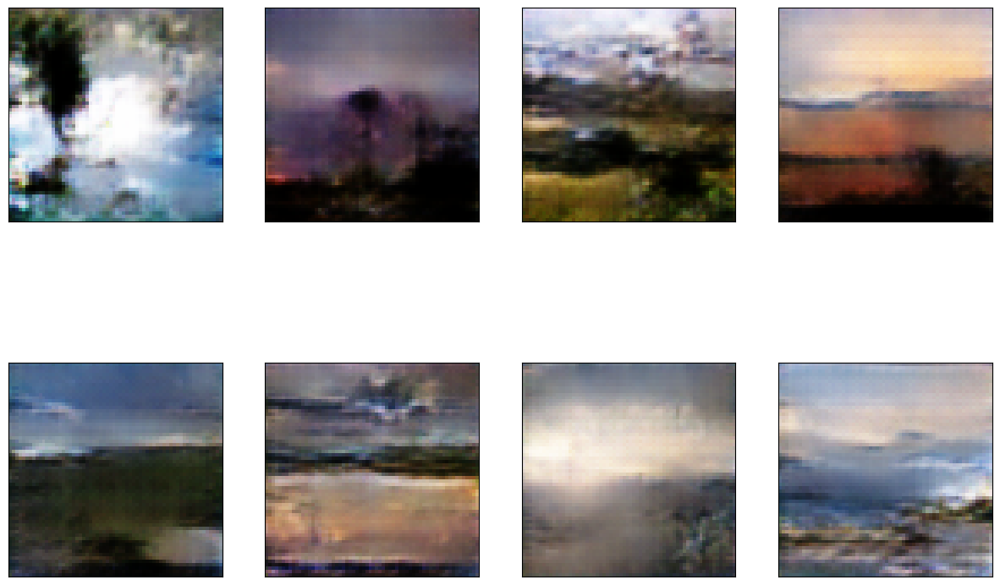

Epoch [   42/  250] | d_loss 0.9132 | g_loss 1.4268


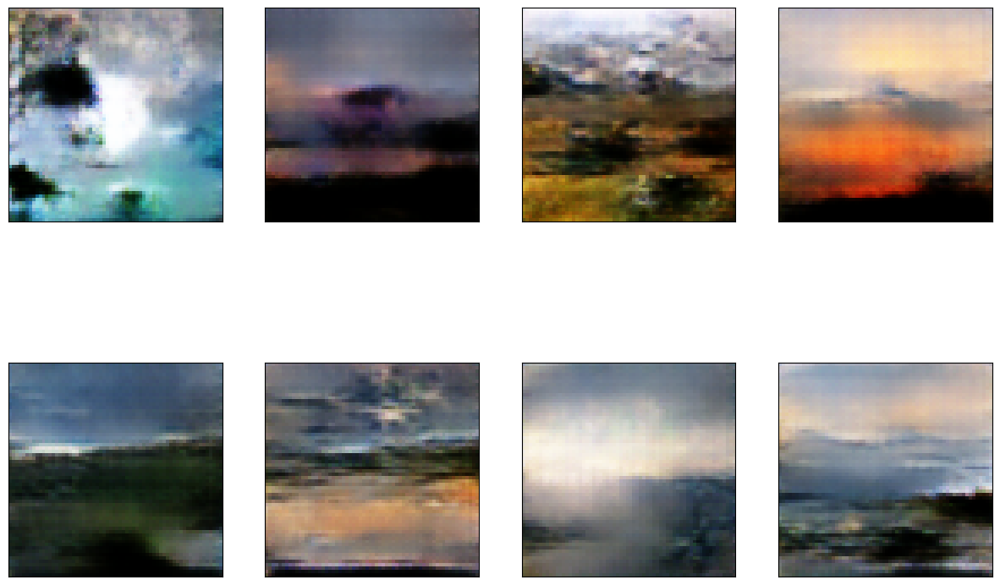

Epoch [   43/  250] | d_loss 0.9052 | g_loss 1.8469


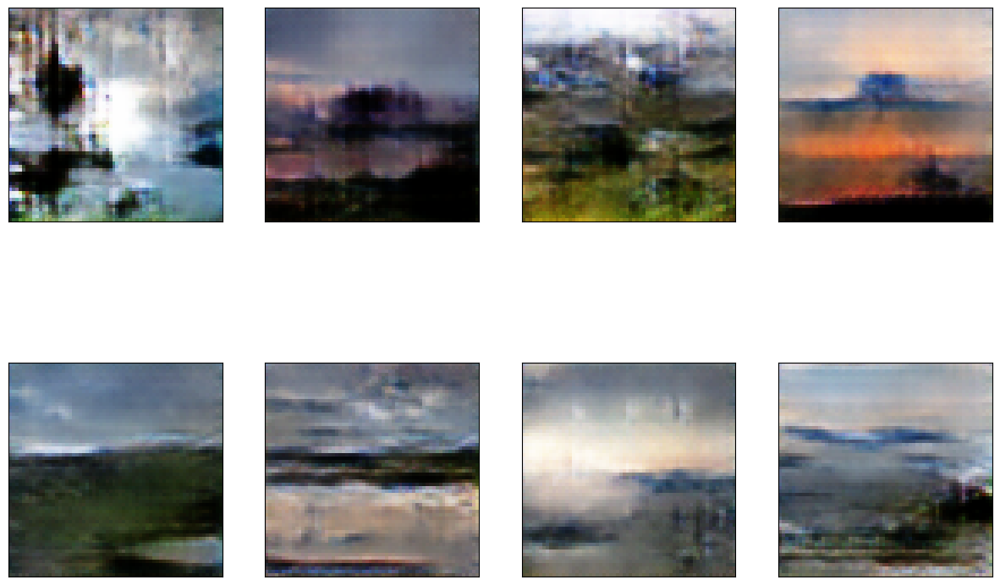

Epoch [   44/  250] | d_loss 0.9593 | g_loss 1.7728


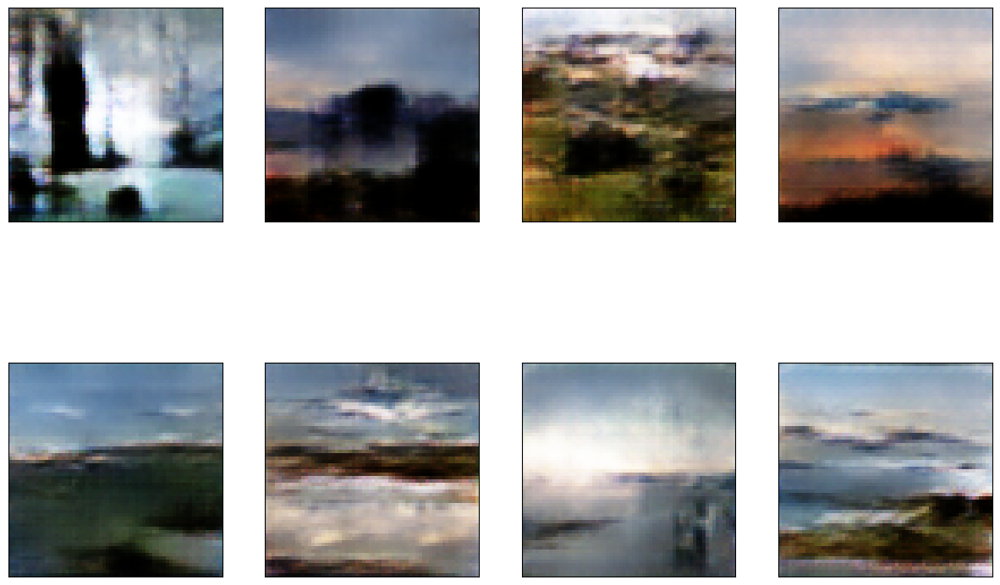

Epoch [   45/  250] | d_loss 0.9469 | g_loss 2.5802


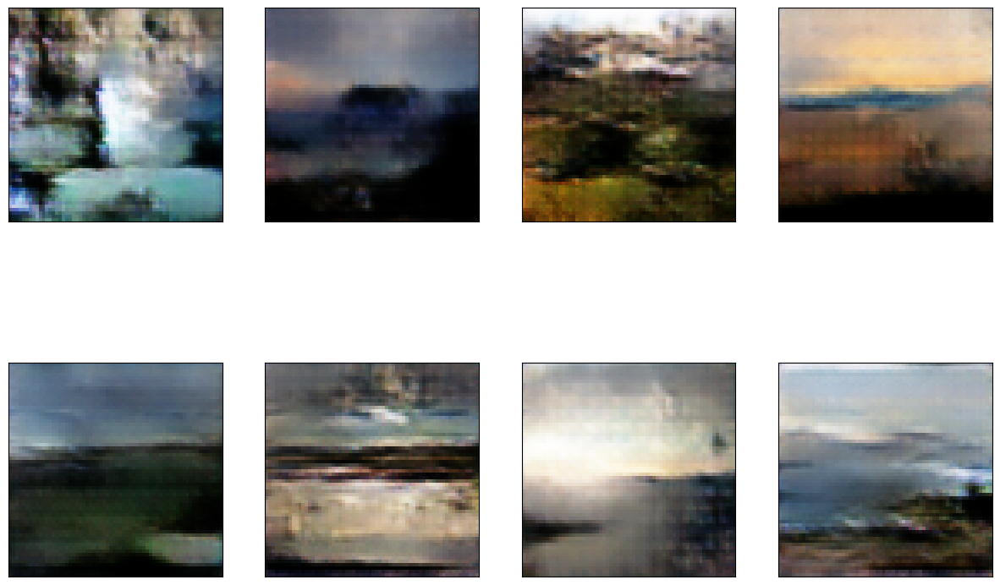

Epoch [   46/  250] | d_loss 0.8931 | g_loss 1.8861


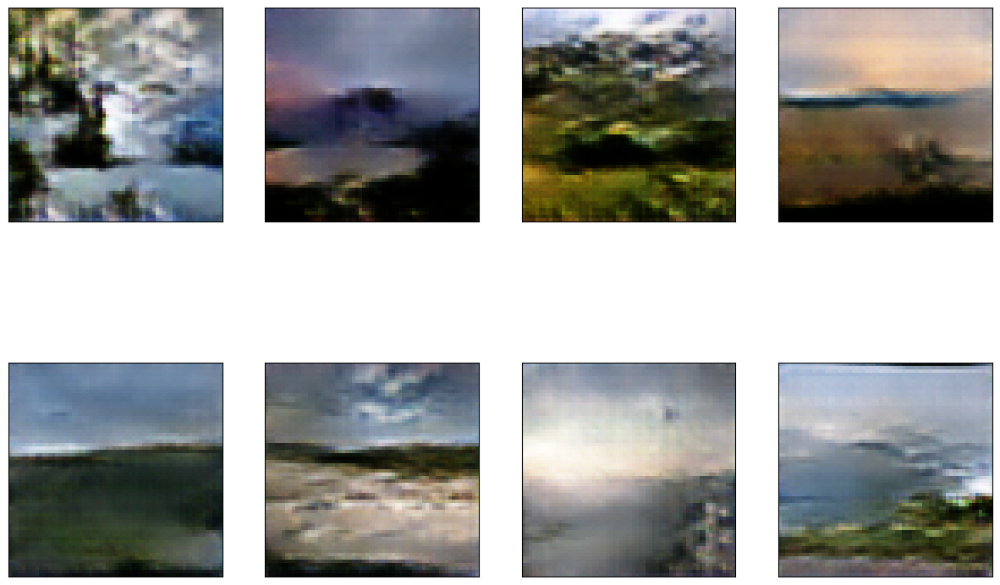

Epoch [   47/  250] | d_loss 0.9084 | g_loss 2.4194


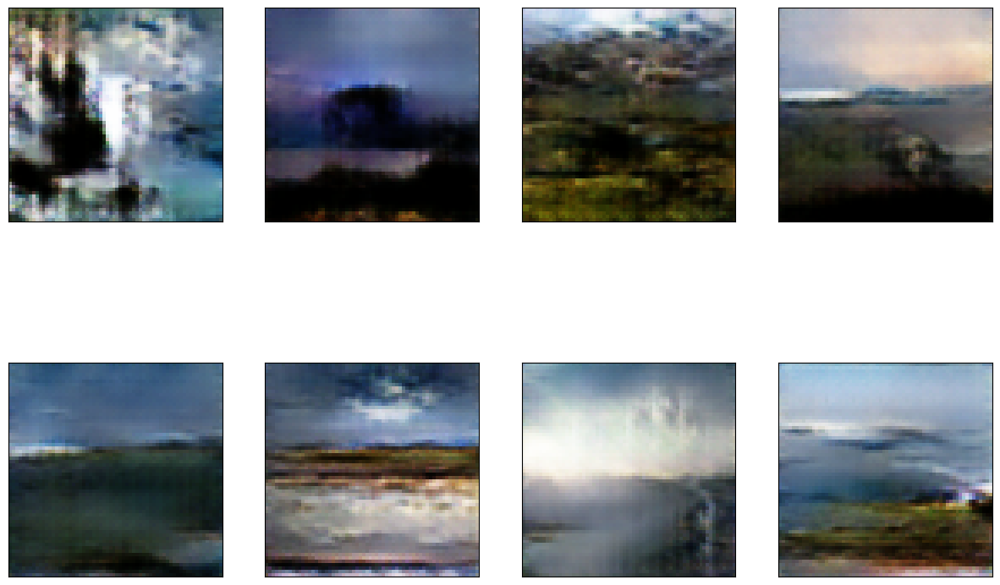

Epoch [   48/  250] | d_loss 0.9900 | g_loss 1.3425


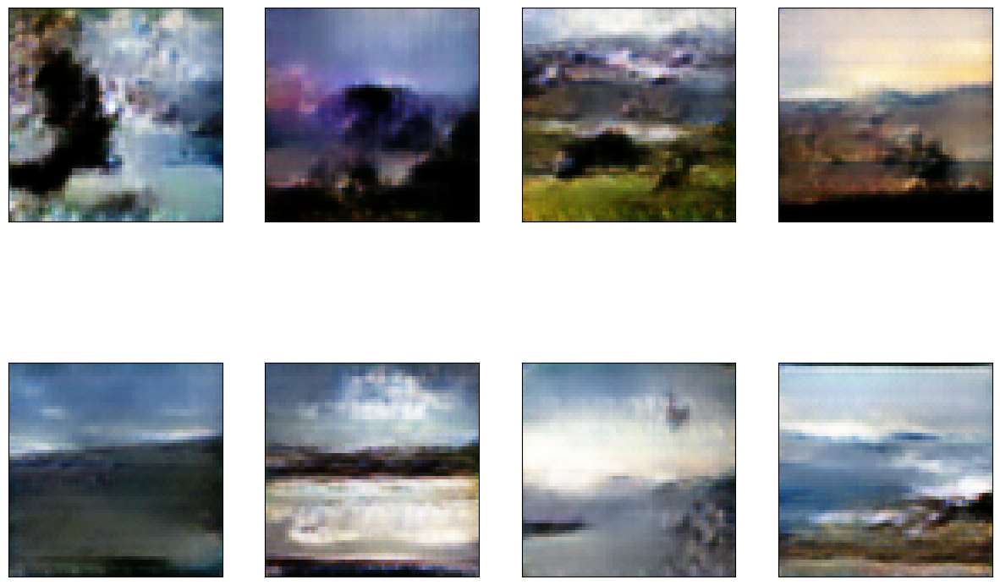

Epoch [   49/  250] | d_loss 1.1340 | g_loss 2.5357


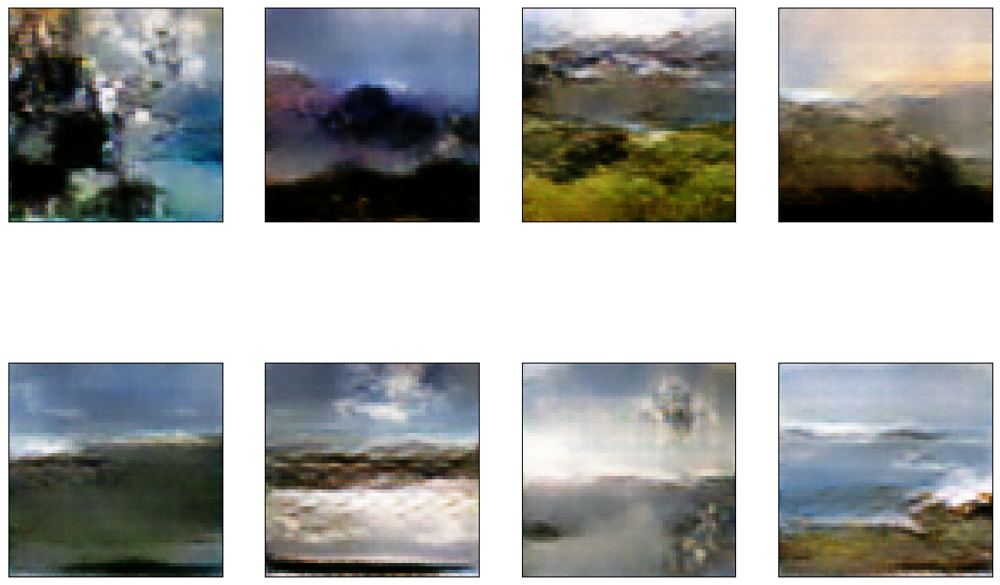

Epoch [   50/  250] | d_loss 1.2549 | g_loss 2.6126


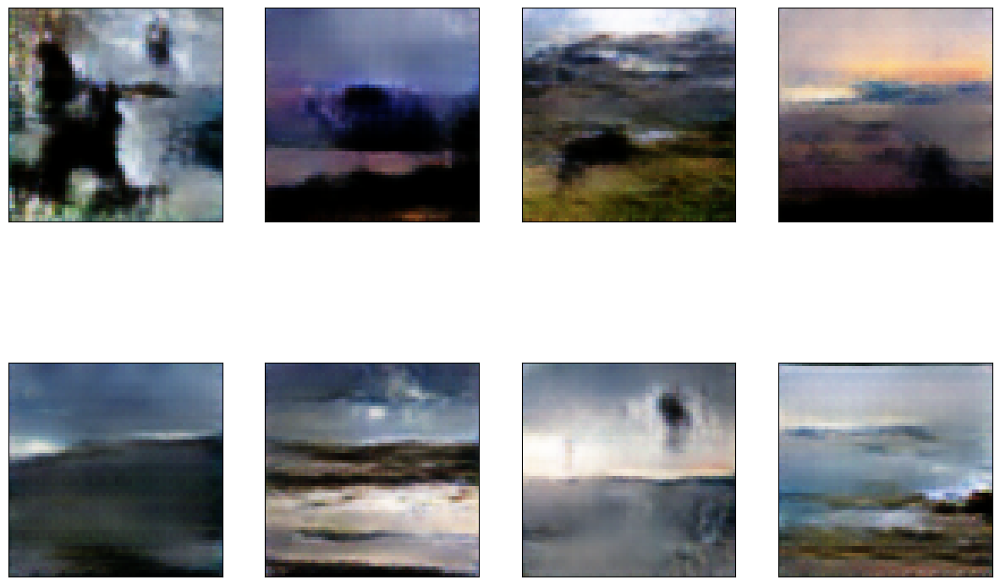

Epoch [   51/  250] | d_loss 0.8528 | g_loss 3.0406


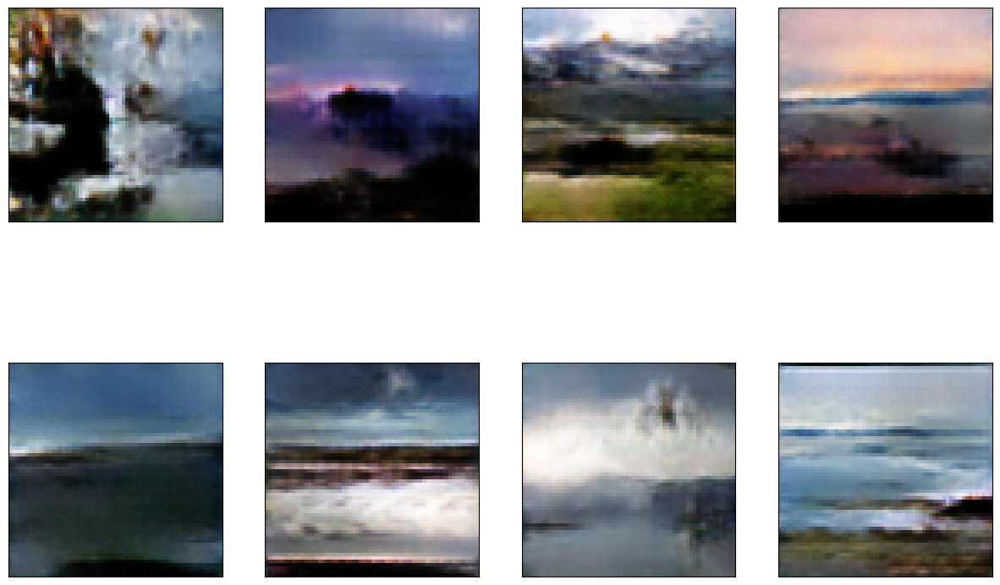

Epoch [   52/  250] | d_loss 0.9469 | g_loss 1.2630


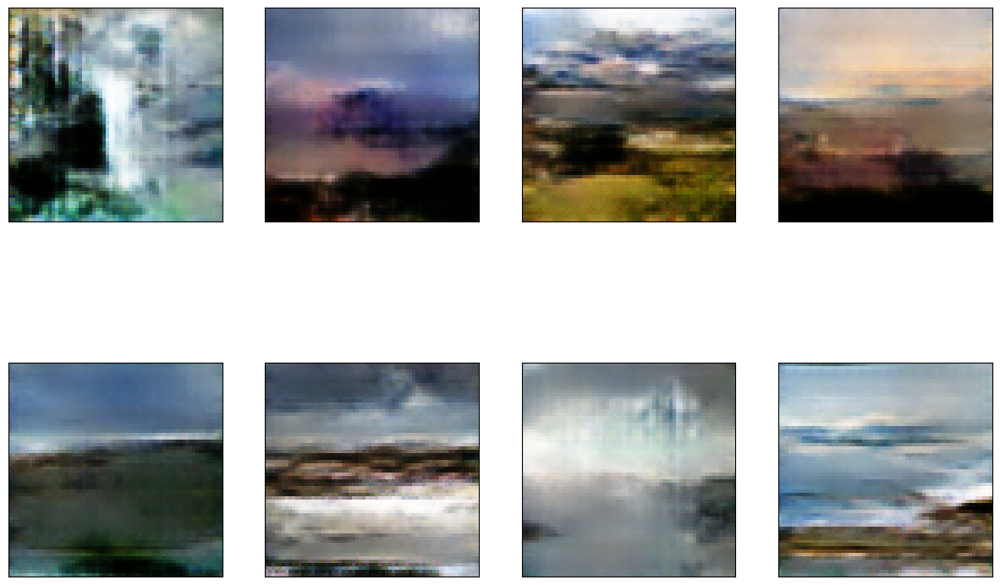

Epoch [   53/  250] | d_loss 0.8874 | g_loss 1.7085


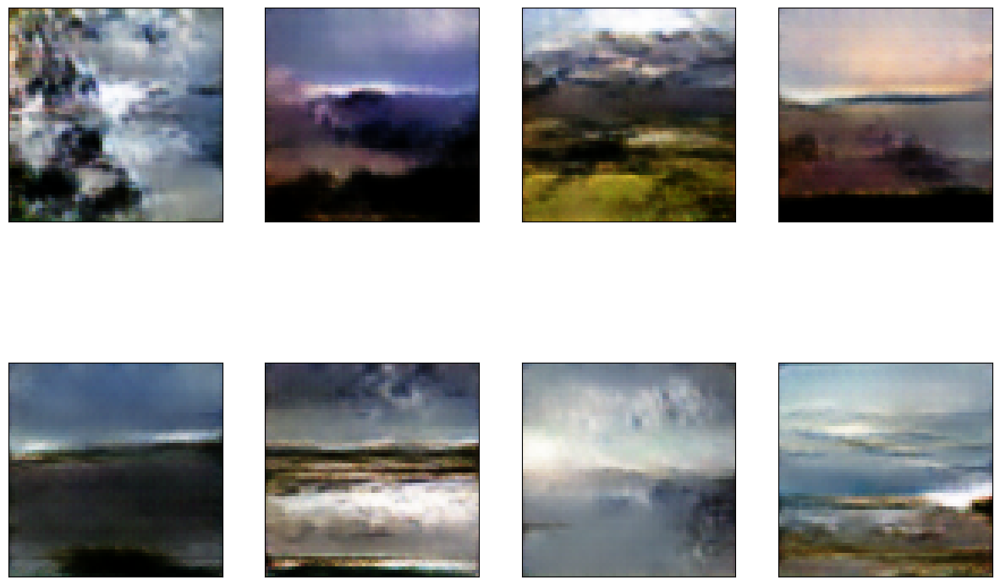

Epoch [   54/  250] | d_loss 0.9206 | g_loss 1.9336


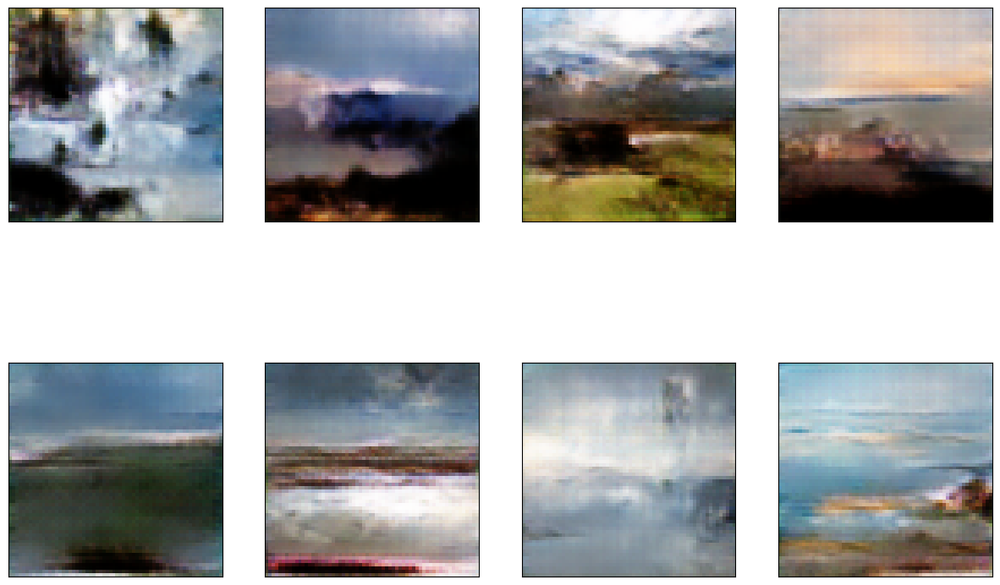

Epoch [   55/  250] | d_loss 0.9781 | g_loss 1.8737


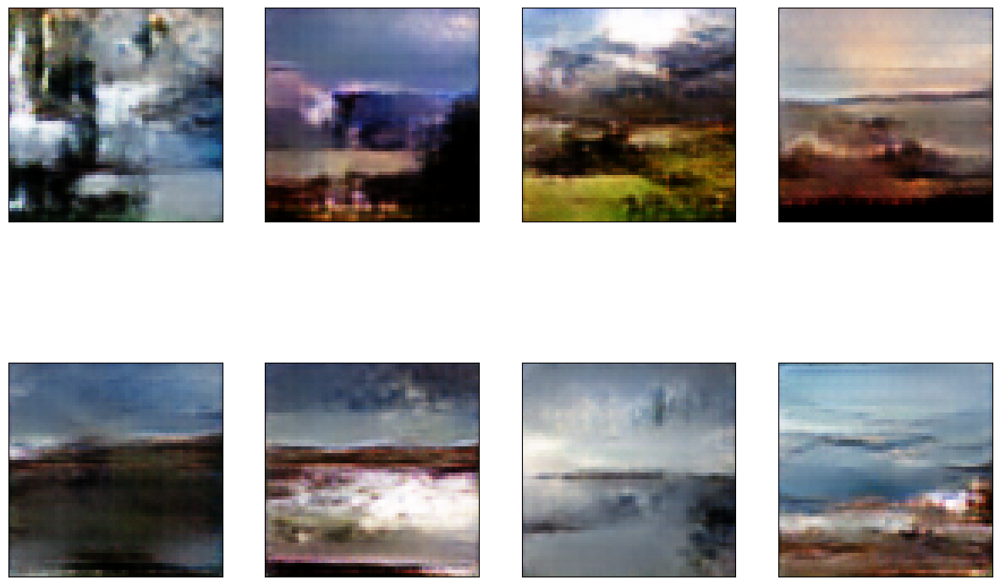

Epoch [   56/  250] | d_loss 1.0678 | g_loss 1.4297


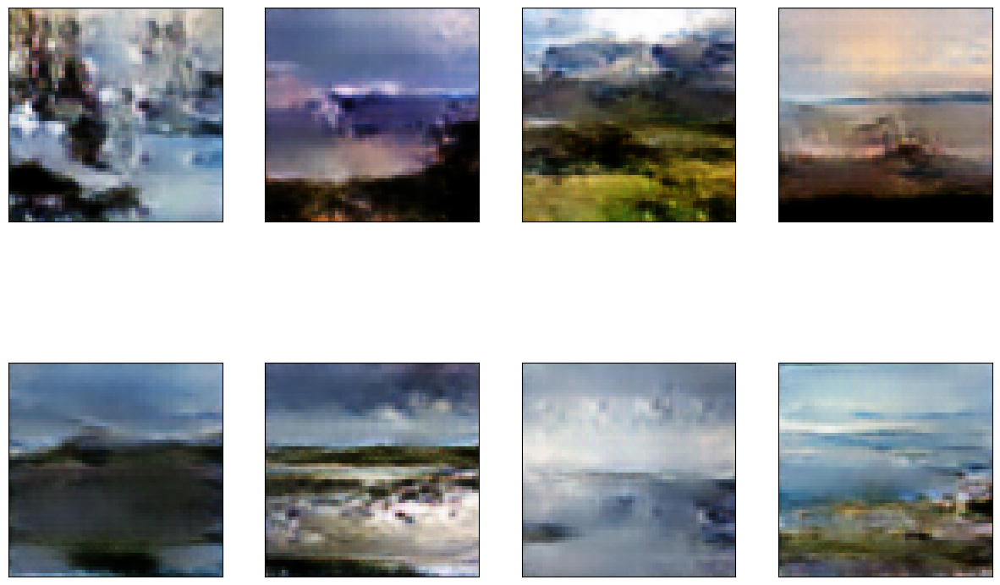

Epoch [   57/  250] | d_loss 0.9672 | g_loss 2.3395


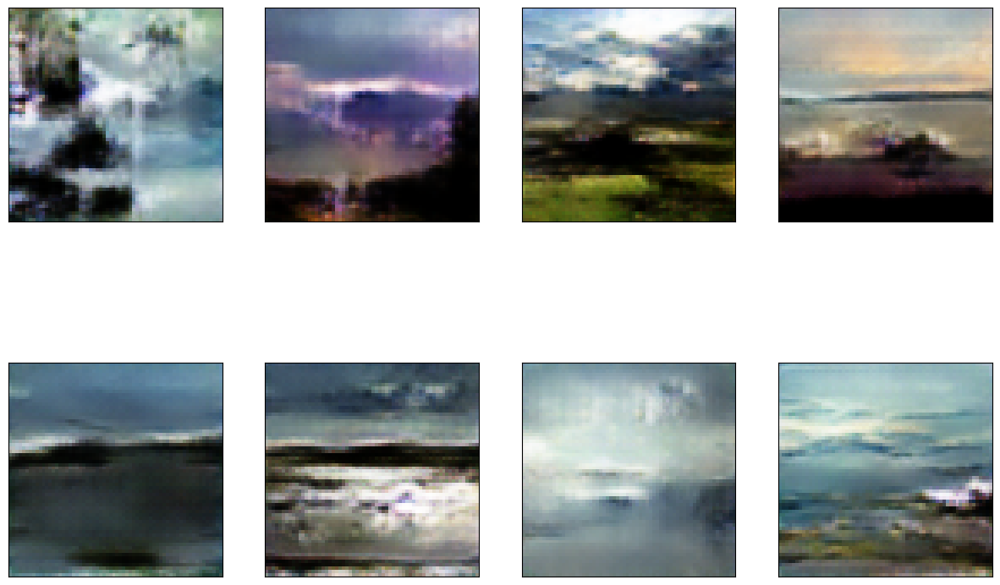

Epoch [   58/  250] | d_loss 0.9579 | g_loss 1.8574


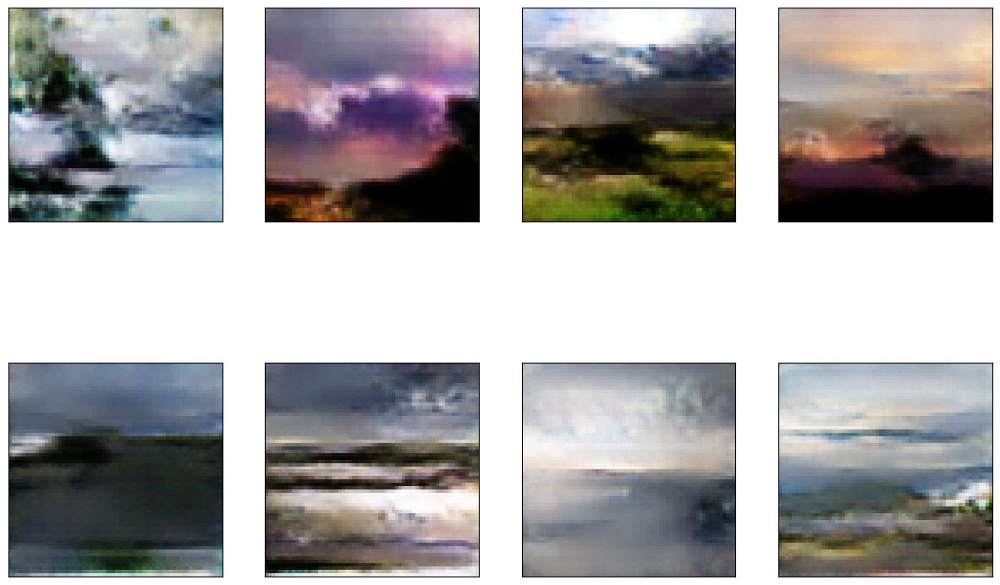

Epoch [   59/  250] | d_loss 1.0345 | g_loss 1.6325


OutOfMemoryError: CUDA out of memory. Tried to allocate 2.00 MiB (GPU 0; 3.81 GiB total capacity; 2.61 GiB already allocated; 1.44 MiB free; 2.70 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [14]:
# Dataset
monet_dataset = Dataset(DATA_DIR)
data_loader = DataLoader(monet_dataset, BATCH_SIZE, shuffle=True, num_workers=N_WORKERS)


# Model
dcgan_model = DCGAN(Z_SIZE, CONV_DIM)

# Oprimizer
d_optimizer = optim.Adam(dcgan_model.D.parameters(), lr, [beta1, beta2])
g_optimizer = optim.Adam(dcgan_model.G.parameters(), lr, [beta1, beta2])

# train
sample_result, losses_history = dcgan_model.train(EPOCHS, d_optimizer, g_optimizer, data_loader, Z_SIZE, SAMPLE_SIZE, print_every=1000)

# Results

In [ ]:
fig, axes = plt.subplots(figsize=(15,10), nrows=2, ncols=4, sharey=True, sharex=True)
for ax, img in zip(axes.flatten(), sample_result[EPOCHS-1]):
    _, w, h = img.size()
     
    img = img.detach().cpu().numpy()

    img = np.transpose(img, (1, 2, 0))
    
    img = ((img +1)*255 / (2)).astype(np.uint8)

    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    
    im = ax.imshow(img.reshape((w,h,3)))

plt.show()

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses_history)
plt.plot(losses.T[0], label='Discriminator')
plt.plot(losses.T[1], label='Generator')
plt.title("Training Losses")
plt.legend()
plt.show()